<a href="https://colab.research.google.com/github/YYC-CHUAN/dip-CTuse/blob/main/Inpainting.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!git clone https://github.com/YYC-CHUAN/dip-CTuse.git
!mv dip-CTuse/* ./

Cloning into 'dip-CTuse'...
remote: Enumerating objects: 378, done.
remote: Counting objects: 100% (247/247), done.
remote: Compressing objects: 100% (178/178), done.
remote: Total 378 (delta 101), reused 191 (delta 66), pack-reused 131 (from 1)
Receiving objects: 100% (378/378), 7.61 MiB | 18.88 MiB/s, done.
Resolving deltas: 100% (129/129), done.


In [ ]:
from __future__ import print_function
import matplotlib.pyplot as plt
%matplotlib inline

import os
# os.environ['CUDA_VISIBLE_DEVICES'] = '1'

import numpy as np
from models.resnet import ResNet
from models.unet import UNet
from models.skip import skip
import torch
import torch.optim

from utils.inpainting_utils import *

torch.backends.cudnn.enabled = True
torch.backends.cudnn.benchmark =True
dtype = torch.cuda.FloatTensor

PLOT = True
imsize = -1
dim_div_by = 64

In [ ]:
img_path  = 'data-new/Inpainting/liver2.jpg'
mask_path = 'data-new/Inpainting/kate_mask.png'

NET_TYPE = 'skip_depth6'

In [ ]:
img_pil, img_np = get_image(img_path, imsize)
img_mask_pil, img_mask_np = get_image(mask_path, imsize)

In [ ]:
img_mask_pil = crop_image(img_mask_pil, dim_div_by)
img_pil      = crop_image(img_pil,      dim_div_by)

img_np      = pil_to_np(img_pil)
img_mask_np = pil_to_np(img_mask_pil)

size1 = img_np.shape
size2 = img_mask_np.shape
print("数组的大小是:", size1, size2)

数组的大小是: (3, 512, 512) (1, 512, 512)


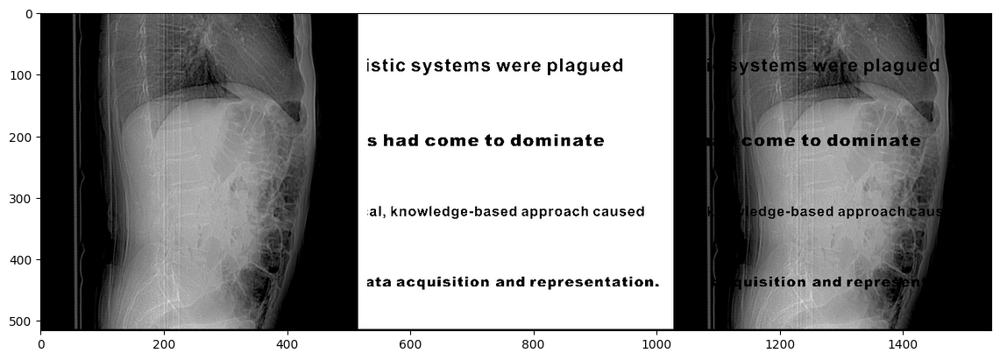

In [ ]:
img_mask_var = np_to_torch(img_mask_np).type(dtype)

plot_image_grid([img_np, img_mask_np, img_mask_np*img_np], 3,11);

In [ ]:
pad = 'reflection' # 'zero'
OPT_OVER = 'net'
OPTIMIZER = 'adam'

In [ ]:

if 'vase.png' in img_path:
    INPUT = 'meshgrid'
    input_depth = 2
    LR = 0.01
    num_iter = 5001
    param_noise = False
    show_every = 50
    figsize = 5
    reg_noise_std = 0.03

    net = skip(input_depth, img_np.shape[0],
               num_channels_down = [128] * 5,
               num_channels_up   = [128] * 5,
               num_channels_skip = [0] * 5,
               upsample_mode='nearest', filter_skip_size=1, filter_size_up=3, filter_size_down=3,
               need_sigmoid=True, need_bias=True, pad=pad, act_fun='LeakyReLU').type(dtype)

# elif ('kate.png' in img_path) or ('peppers.png' in img_path):
elif ('liver2.jpg' in img_path) or ('peppers.png' in img_path):
    # Same params and net as in super-resolution and denoising
    INPUT = 'noise'
    input_depth = 32
    LR = 0.01
    num_iter = 6001
    param_noise = False
    show_every = 100
    figsize = 5
    reg_noise_std = 0.03

    net = skip(input_depth, img_np.shape[0],
               num_channels_down = [128] * 5,
               num_channels_up =   [128] * 5,
               num_channels_skip =    [128] * 5,
               filter_size_up = 3, filter_size_down = 3,
               upsample_mode='nearest', filter_skip_size=1,
               need_sigmoid=True, need_bias=True, pad=pad, act_fun='LeakyReLU').type(dtype)

elif 'library.png' in img_path:

    INPUT = 'noise'
    input_depth = 1

    num_iter = 3001
    show_every = 50
    figsize = 8
    reg_noise_std = 0.00
    param_noise = True

    if 'skip' in NET_TYPE:

        depth = int(NET_TYPE[-1])
        net = skip(input_depth, img_np.shape[0],
               num_channels_down = [16, 32, 64, 128, 128, 128][:depth],
               num_channels_up =   [16, 32, 64, 128, 128, 128][:depth],
               num_channels_skip =    [0, 0, 0, 0, 0, 0][:depth],
               filter_size_up = 3,filter_size_down = 5,  filter_skip_size=1,
               upsample_mode='nearest', # downsample_mode='avg',
               need1x1_up=False,
               need_sigmoid=True, need_bias=True, pad=pad, act_fun='LeakyReLU').type(dtype)

        LR = 0.01

    elif NET_TYPE == 'UNET':

        net = UNet(num_input_channels=input_depth, num_output_channels=3,
                   feature_scale=8, more_layers=1,
                   concat_x=False, upsample_mode='deconv',
                   pad='zero', norm_layer=torch.nn.InstanceNorm2d, need_sigmoid=True, need_bias=True)

        LR = 0.001
        param_noise = False

    elif NET_TYPE == 'ResNet':

        net = ResNet(input_depth, img_np.shape[0], 8, 32, need_sigmoid=True, act_fun='LeakyReLU')

        LR = 0.001
        param_noise = False

    else:
        assert False
else:
    assert False

net = net.type(dtype)
net_input = get_noise(input_depth, INPUT, img_np.shape[1:]).type(dtype)

In [ ]:
# Compute number of parameters
s  = sum(np.prod(list(p.size())) for p in net.parameters())
print ('Number of params: %d' % s)

mse = torch.nn.MSELoss().type(dtype)

img_var = np_to_torch(img_np).type(dtype)
mask_var = np_to_torch(img_mask_np).type(dtype)



Number of params: 3002627


Starting optimization with ADAM


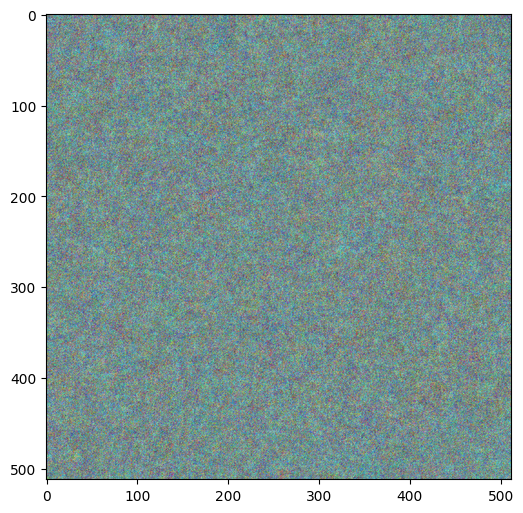

Iteration 0 PSNR history: [8.93160488105041]
Average PSNR over last 100 iterations: 0.09


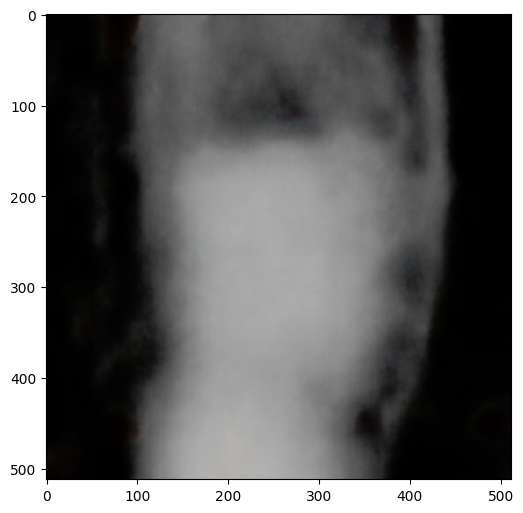

Iteration 100 PSNR history: [10.514092603118815, 9.728327389125837, 11.796326103396424, 8.312848914950797, 10.545803720726457, 12.252223346171236, 12.73250084668643, 15.38974851795147, 17.635525642096585, 18.433242761092018, 20.189095856667407, 19.563250370345852, 19.831783374072266, 20.01435220591324, 20.738882446967104, 20.86970515336096, 20.621793871094624, 21.20266798461333, 21.888443163785137, 22.40596324011749, 22.84103334270306, 22.958893693087088, 22.811304909402452, 22.93136256702371, 22.758262541734894, 23.26805671992815, 23.177493387381553, 22.706342402731284, 23.404646289832858, 23.25225887689061, 23.705958879167362, 23.329639212808104, 24.085480804150134, 23.478962509041846, 24.084051802769814, 24.03518155683281, 23.81800399888126, 24.348633865987722, 24.46151474821503, 23.769678424292877, 23.952332123583187, 24.02350124674625, 24.747299677627453, 24.89498691115041, 24.53582625545762, 24.834565704051936, 24.451041867151368, 24.64598693346514, 24.75365320775119, 24.94798342

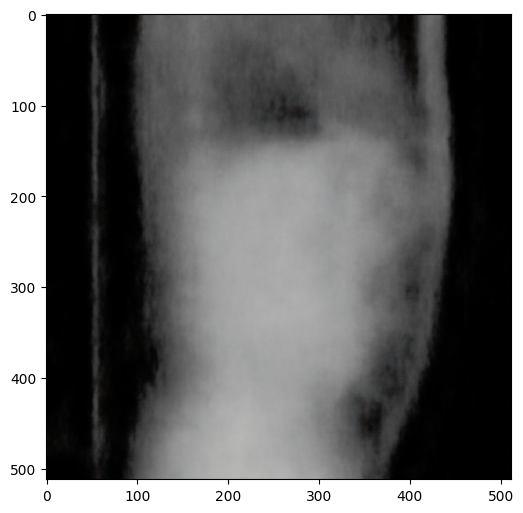

Iteration 200 PSNR history: [25.653774034667602, 25.871500307853776, 25.86332418068092, 25.996532997506137, 25.90923048046151, 26.240504926383785, 26.002078954454554, 26.142925069353712, 25.66413855104297, 26.370768283084672, 26.20580276912206, 26.11307464743942, 26.096382134034705, 26.28087243146439, 26.289231447288874, 26.0520506432313, 26.15157449922423, 26.345221700977753, 25.98331738464072, 26.650580771569192, 26.358773082337855, 26.478011568960056, 26.138311349966756, 26.23266503940895, 26.747342520322995, 26.350597136555972, 26.668744581675266, 26.418402761761737, 26.519035540911094, 26.477252251787515, 26.60194386576078, 26.58205723271538, 26.4635408677486, 26.636008961774607, 26.503107841479533, 26.762681830551927, 26.856510246399594, 26.680748693011815, 26.746260604066823, 26.732495104891143, 26.493420748409694, 26.870455752543883, 26.777697527389925, 26.54182089843421, 26.73410924145522, 26.60421775273859, 26.855283511393804, 26.761571865832394, 26.999532246080605, 26.628620

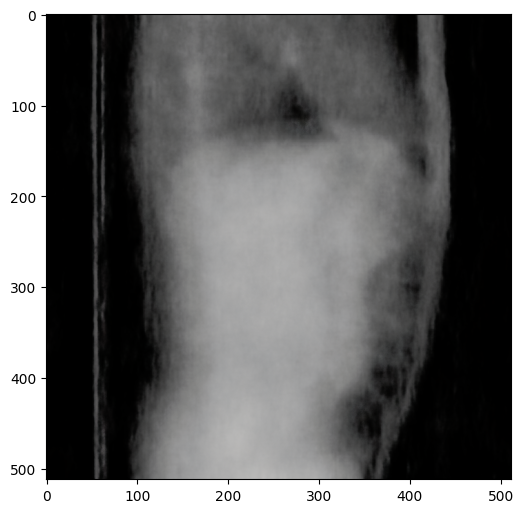

Iteration 300 PSNR history: [27.835752944368032, 27.84621273262726, 27.647132714436932, 27.641937104751673, 27.914305447807024, 27.853260722225045, 27.90769517222, 27.720164212918608, 27.761350032960266, 27.994265313093763, 27.837412720593782, 27.966088726904644, 27.841549113244447, 27.66045694951249, 28.04012820994917, 28.013911270510718, 28.005590303384587, 27.964987659363437, 27.73931954204057, 27.832106751318427, 27.71275775397594, 27.95041445594491, 27.208142780479, 27.980252815116863, 28.021844832544286, 27.96189408728617, 27.74450555430375, 28.069629183892303, 28.00563381693334, 28.07543586857083, 27.99243669004342, 27.985753441025256, 28.054352039812525, 28.180677897352318, 28.025509797740746, 28.159975990994717, 28.380098664759323, 27.936994671626728, 27.995448081806384, 28.084084153970167, 28.112330234882883, 28.211129548832883, 28.383846616492477, 28.368682902498584, 28.341738623844623, 28.419227253365055, 28.281221394135812, 28.1145845393554, 27.998742011471244, 28.33188693

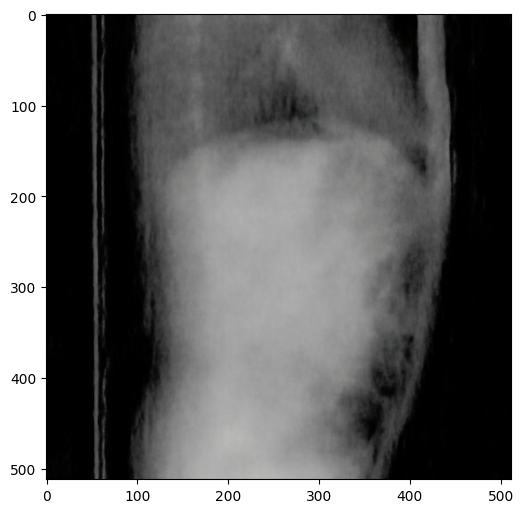

Iteration 400 PSNR history: [28.698723756044814, 29.023873911596635, 29.017390686716496, 29.012625849404827, 29.142430548266745, 29.15626989424069, 28.849226191004487, 29.063592486629048, 29.221990242540514, 29.116510806738276, 29.055958274994907, 28.994562892220642, 29.100875150955638, 29.00561943076775, 29.194919535660382, 29.13985433067941, 29.402224761439225, 29.18435312402123, 29.27639023923417, 29.374312006641738, 29.205144722270727, 29.198368586105225, 29.21645588788081, 29.339024157405795, 29.34252765981306, 29.301873703449665, 29.02369064289246, 29.22077201966841, 29.401899521889135, 29.100520115362684, 29.03105997080091, 29.26070580933642, 29.592909628600875, 29.30035823106278, 29.530562276514523, 29.318205454132116, 29.41380233532716, 29.337033426379797, 29.101327113457295, 29.42397643644245, 29.256489882846644, 29.302799863349826, 29.56805803472582, 29.216143650819344, 29.369748509517738, 29.453475264384615, 29.413116712593407, 29.45194332059468, 29.643759188229662, 29.3295

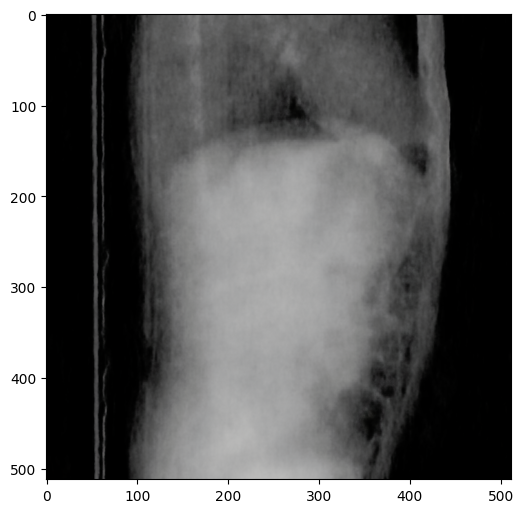

Iteration 500 PSNR history: [29.794253517663748, 29.62685942543711, 29.88306748483183, 29.93524680539369, 29.640024050325597, 29.9793854661813, 29.810619057263178, 30.046529454186242, 29.76404077352331, 29.929904145021055, 29.818002043470347, 29.976498353838316, 29.98124943753302, 29.712772661361, 30.034045982718986, 29.585792391955867, 29.70629695608143, 29.590272945401026, 29.81482388219468, 29.86563561736265, 29.874020935061957, 29.731010431006165, 29.411549503488594, 29.931506444024926, 29.99820336587152, 29.5833961992237, 29.137411269725717, 30.07709368897079, 29.98427149583735, 29.88016681601463, 30.078240308623595, 30.053695954611115, 29.93273771560499, 30.12671369126228, 29.852629610008616, 30.009216274406402, 30.19635743088422, 30.310419213838724, 29.707950130900038, 30.183907804249014, 30.130939120163077, 30.200008326357572, 30.192026023769877, 29.98497115463516, 30.06265236117518, 30.375611956419494, 30.255966560268227, 30.038914287435972, 30.34728561657146, 30.1750832142003

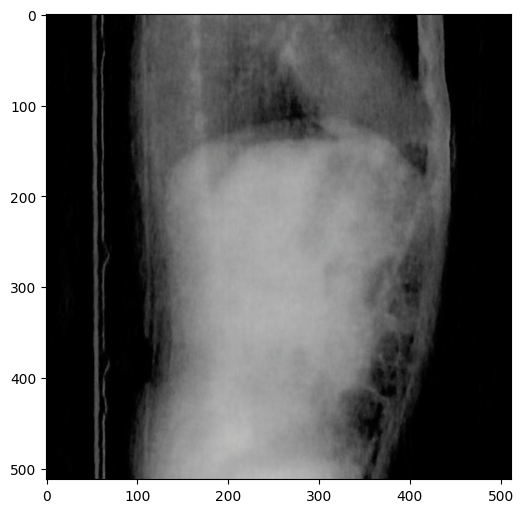

Iteration 600 PSNR history: [30.493737522669054, 30.53854101581315, 30.40180539012995, 30.55240987059392, 30.424530720118774, 30.340631669104322, 30.462966376716896, 30.444120376954544, 30.665828871894526, 30.5143197206328, 30.212544145346012, 30.41729939174886, 30.41961724784501, 30.104230282410725, 30.355212510652922, 30.463484540223345, 30.46496316176178, 30.539204112684693, 30.646945750286992, 30.35329637681876, 30.823126729117032, 30.209353587851453, 30.64075267324796, 30.735002259319067, 30.514108948672224, 30.66646442657111, 30.786354347152777, 30.522407696261226, 30.802493320748887, 30.71831943625389, 30.59171950802275, 30.58770492828433, 30.803419520286624, 30.718973575021412, 30.503795578937407, 30.533894238451808, 30.63886743787394, 30.51463721163951, 30.61699013653915, 30.733063444614196, 30.642841875808074, 30.72443100832802, 30.386659224348406, 30.358643024079846, 30.78639415527003, 30.639327636525458, 30.841692357621397, 30.314958522901062, 30.492915726242433, 30.4405495

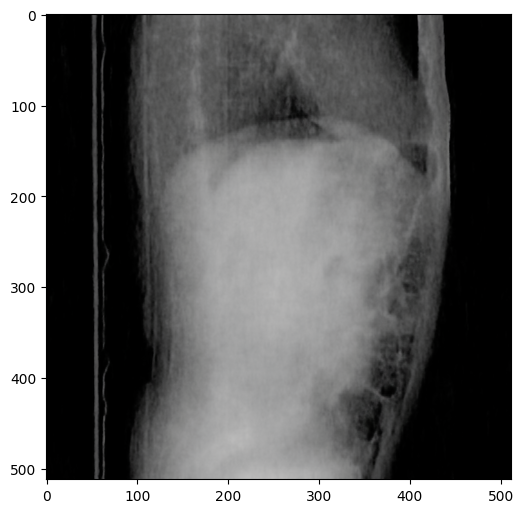

Iteration 700 PSNR history: [31.03692466037693, 31.080311358259078, 30.692099236177583, 30.65811042430438, 30.81492936950942, 30.389646425560244, 30.948442646779377, 31.04030938380224, 30.555682809754835, 30.866623585120358, 30.99228129380444, 31.0306616748463, 30.788458292506114, 30.51669657291874, 30.71637154099043, 30.806659337535965, 30.812526334122982, 31.012995189688954, 30.857364265910054, 30.624707594855643, 30.831264706307877, 30.712468609200968, 30.632369717126213, 30.978253351545177, 30.93421076414161, 30.86901449324014, 31.022151825596573, 30.961380462696578, 31.1203952902375, 30.90209074114419, 30.99040830100173, 31.08646791545049, 31.124768911137775, 31.023015875928067, 31.035458226002845, 30.895545549494145, 31.10082761562093, 30.979148943984434, 31.142914091636897, 30.960208706700666, 31.011570433469068, 31.171597479451542, 31.193372823670188, 31.123411752088362, 31.229726470249698, 31.16266834190117, 30.901072136143533, 31.02636275197684, 31.19592525219833, 31.30433184

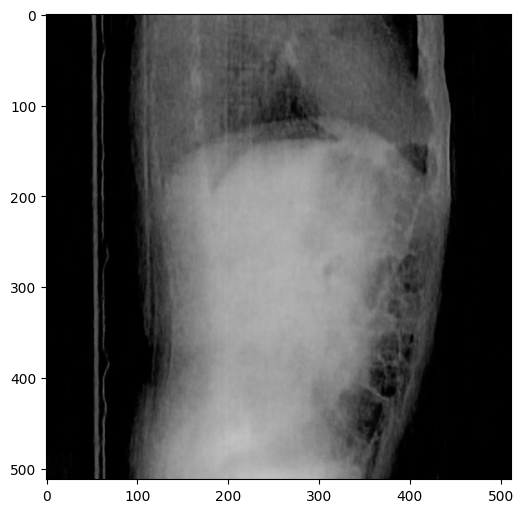

Iteration 800 PSNR history: [31.36047570194691, 31.348016107507494, 31.33972072204557, 31.27605297098895, 31.28366005948607, 31.195016610599872, 31.331471715492203, 31.30455085424632, 31.295570100442674, 31.23831562316585, 31.551366783782054, 31.39703872974117, 31.30288306291227, 31.273725480088807, 31.49544370283895, 31.337526103135083, 31.171674375065752, 31.438780691022316, 31.490117175736714, 31.422997491086125, 31.279105830904484, 31.426500196838333, 31.478648454984793, 31.430594663689064, 31.385921620880563, 31.36450242769798, 31.48982465166128, 31.510017780721707, 31.310422494113975, 31.481913110239425, 31.330379176034935, 31.50051196282441, 31.310108091712614, 31.28067929570925, 31.414912761091042, 31.562577618564486, 31.558248214373997, 31.484188302886604, 31.434485511589077, 31.598970708729087, 31.298969848448536, 31.565161289842237, 31.39331168747221, 31.500569924221047, 31.384501391202445, 31.520329984216144, 31.652596092501717, 31.354036717674045, 31.602416261948896, 31.38

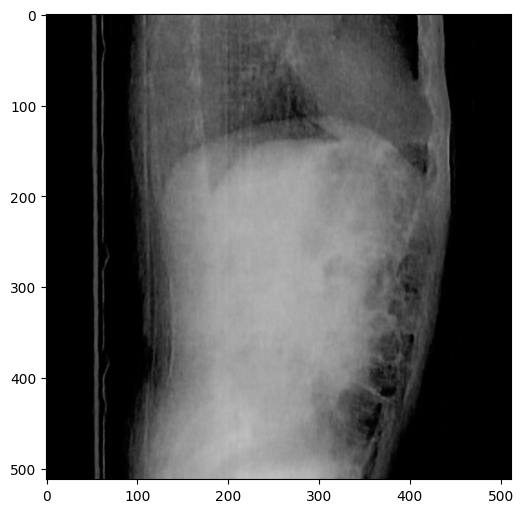

Iteration 900 PSNR history: [31.611844164136812, 31.78351263951584, 31.616027462183418, 31.524367734438677, 31.696873640038447, 31.766330281005928, 31.529911252124222, 31.819778452206407, 31.595217542041688, 31.915692872808265, 31.8422097853988, 31.643506148902713, 31.818886877330023, 31.823303273517247, 31.804062717755457, 31.643004452576413, 31.83130736010366, 31.86194379814408, 31.766522341865695, 31.8042299872463, 31.85616614860397, 31.55690072718143, 31.894504996823446, 31.831779717691337, 31.896381123172045, 31.631750741753578, 31.740791029447944, 31.84178170152866, 31.88243040804018, 31.806544204874072, 31.85745080798343, 31.70606335889831, 31.709288536251783, 31.63387559798469, 31.794258104266753, 31.745820767740707, 31.702771066999226, 31.856508389419385, 31.79189848860016, 31.64359385328105, 31.80884840372365, 31.727524257748843, 31.634032753318646, 31.811702080174086, 31.87245034407596, 31.70791195912478, 31.746547656013476, 31.779002215809484, 31.72540152239643, 31.84843396

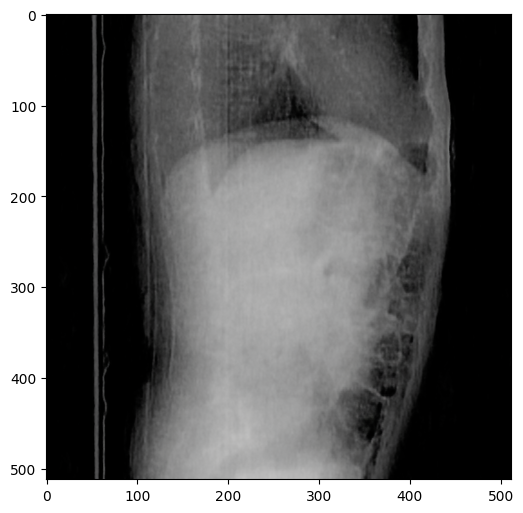

Iteration 1000 PSNR history: [31.98510311024299, 31.983352254280103, 31.85861471019459, 31.878611656420762, 32.04188666211681, 31.956991120717667, 31.924891598625294, 32.058689316928806, 32.07677906474221, 32.07813893786772, 31.943751586680964, 31.786432094581805, 32.14983640436556, 32.00295520654467, 32.03162143102542, 32.030180238513736, 32.13210517523709, 32.012583997327184, 32.04362795851317, 32.22279111312115, 32.0213369754065, 32.20566402412083, 31.93824417777911, 32.04952193389125, 32.07168796387716, 31.957477647176592, 32.12690094979298, 32.062349133045615, 32.01886177944975, 32.16695536439124, 31.876627014443688, 32.21914270299889, 32.13045113488616, 32.0565427811026, 32.124092815096525, 31.716806695440134, 32.00852936327091, 32.23497082736722, 32.04342303118396, 32.175688682444274, 32.063358994659225, 32.06845204982778, 32.140897281129604, 31.875260899869318, 32.090847818604274, 32.21673672956159, 32.14713342906994, 32.1441101260106, 32.21342279492478, 32.144751127929716, 32.

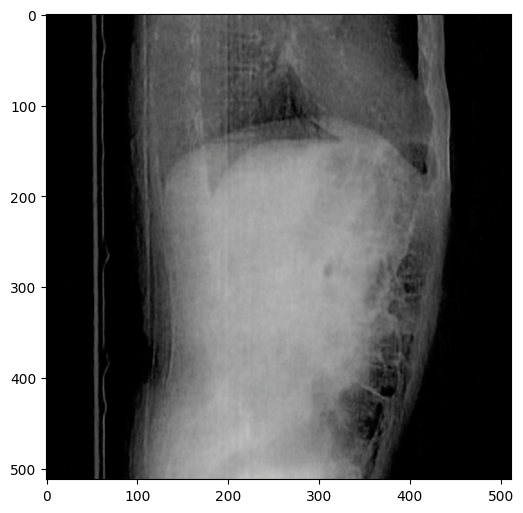

Iteration 1100 PSNR history: [32.197777050118844, 32.408662492976596, 32.36739498618806, 32.39012162672884, 32.13777235520408, 32.313925858208215, 32.23169217381575, 32.19958029098769, 32.193634391552614, 32.340771182952615, 32.36381591259918, 32.31061932273751, 32.392182084200456, 32.2107349381021, 32.4913539610807, 32.46852967055918, 32.25207818209678, 32.26532229551772, 32.30740165102781, 32.52043177385977, 32.33775369676917, 32.196617466534775, 32.27003575757748, 32.42797769064994, 32.45247398374139, 32.30542076999525, 32.41140735556427, 32.32528344192638, 32.20946515009687, 32.46729100391592, 32.473600354425535, 32.302115652448556, 32.27456539926402, 32.516634254913335, 32.48907683891021, 32.17038690309215, 32.428227776581515, 32.323008859694994, 32.40178812001823, 32.46886243135139, 32.40677497726337, 32.379769571058794, 32.17971959148019, 32.497339637772015, 32.25712527139953, 32.406869859846964, 32.444043681497526, 32.27200435054864, 32.45065097902788, 32.38694076994952, 32.555

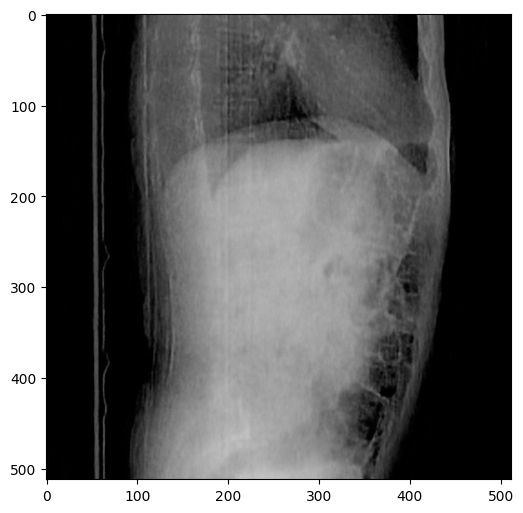

Iteration 1200 PSNR history: [32.60354357873173, 32.4585768022127, 32.61035903010396, 32.677272883540766, 32.65265960655907, 32.53288824938834, 32.55467853988955, 32.42501224156967, 32.435912517468836, 32.695162685482615, 32.676480528411524, 32.38100303721893, 32.55298853801163, 32.5433594656359, 32.328489067298854, 32.61700703112021, 32.6085053690536, 32.61244997122415, 32.50104559506155, 32.60114833950465, 32.76898944149657, 32.581609588341145, 32.72512048422862, 32.34571479927476, 32.68330712344781, 32.55009233448915, 32.51830492146931, 32.7211192869175, 32.18680260141478, 32.414523508070445, 32.517683873668716, 32.40992802302643, 32.672856964411984, 32.2960270390965, 32.776535406332364, 32.687768067022816, 32.42285318923407, 32.64175797974172, 32.56801120923741, 32.60283471759942, 32.59782252274543, 32.518325327161165, 32.713039557965345, 32.54216008147497, 32.74840993777702, 32.56766253580843, 32.814862688262195, 32.75530718979073, 32.74318261976364, 32.72432228176168, 32.56554714

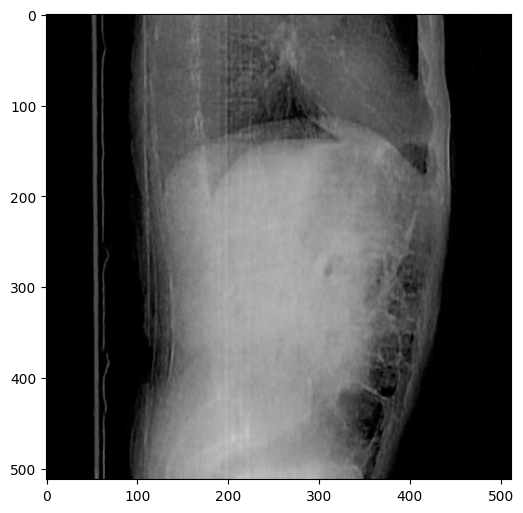

Iteration 1300 PSNR history: [32.96639355842169, 32.88310230797516, 32.840810846854886, 32.90029552341849, 32.722790768690366, 32.83618021959771, 32.91724421298225, 32.92688039415413, 32.80703120965582, 32.87169366157932, 32.71985585174164, 32.735163018093196, 32.844365718978004, 32.789776638225334, 32.771708274000694, 32.89948876420822, 32.9669236278299, 33.03659404574318, 32.73392374085585, 32.93071412276104, 32.773566348954226, 33.0706127919609, 32.82555685955495, 33.042630730882436, 33.06845429236793, 32.86627391884499, 32.938295684341085, 32.92304210608772, 32.925537967096545, 33.013754522275384, 32.92418276545679, 32.95718873177642, 32.94382346608478, 32.921597128186406, 32.886767270684636, 32.90432822819503, 32.91737688592015, 33.04087568685387, 32.90447933640811, 33.0096786902886, 33.14988947289733, 32.949343450265715, 32.929512789354966, 33.00341701548979, 32.952845540959025, 33.10913622134451, 32.90591098236275, 33.1261489176029, 32.93702212399847, 33.05699078319957, 33.01931

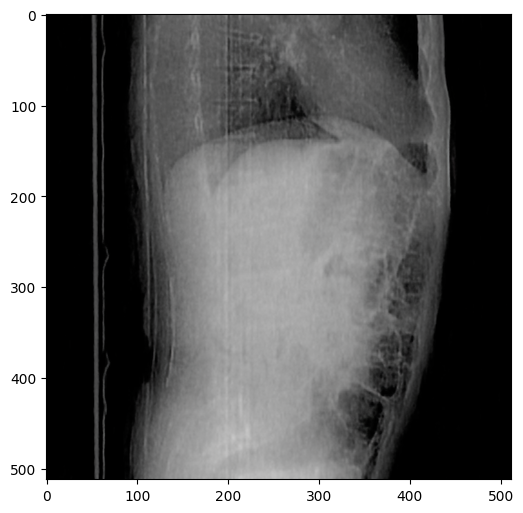

Iteration 1400 PSNR history: [33.115151303184476, 33.123314165403066, 33.13311585901343, 33.16486094372478, 33.06266424583852, 33.18320603210141, 33.16578430895328, 33.21205308622717, 33.12845063171998, 33.20890655921132, 33.062273081707126, 33.22503448950663, 33.00347096006171, 33.17653478422377, 33.1248089595125, 33.17114863211048, 33.17082722491554, 33.0761802964899, 33.16020576280556, 32.956593682722264, 33.22456885012453, 33.049331823527496, 33.17832270409391, 33.154032010346135, 33.22538825838125, 33.18153573532984, 33.13977799716212, 33.25095184056401, 33.07953523885762, 33.07052714741335, 32.97672733934631, 33.18953082194972, 33.1472103261006, 33.03119636117604, 33.12052895187831, 33.08071164805231, 33.27461473445627, 33.18769854804788, 33.1416469770132, 33.21775323324133, 33.30500110454834, 33.15735468257005, 33.25709156303684, 33.18110128391765, 33.17513797851919, 33.14244680880313, 33.238591994856705, 33.304227255450506, 33.24544564044774, 33.29069512415078, 33.2021447271208

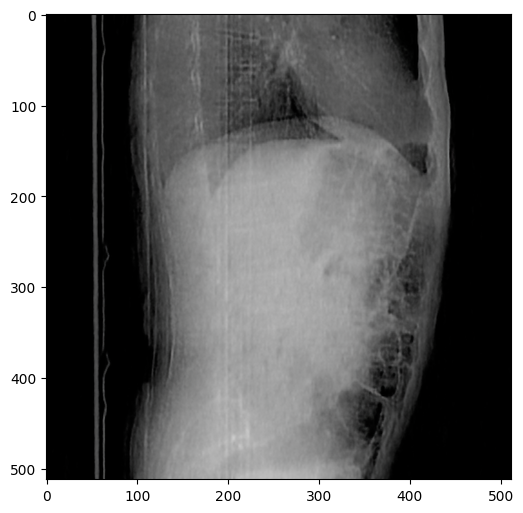

Iteration 1500 PSNR history: [33.379906825161584, 33.34626483111854, 33.339058573861905, 33.18400036538848, 33.409028420402514, 33.44174768678975, 33.41630738242746, 33.44994541453467, 33.43310258377215, 33.274612176450674, 33.47431731462505, 33.31298455475973, 33.41332882958858, 33.48251562570314, 33.42457071515784, 33.41121009428898, 33.4452676233146, 33.36207092455658, 33.33577279674853, 33.36656222119607, 33.47105516784433, 33.526189034437614, 33.3184796565167, 33.582632254162945, 33.415919907769265, 33.49946106984917, 33.44307655943774, 33.494291365200894, 33.48205055103568, 33.42337871793174, 33.47171118185799, 33.46819797221209, 33.45258181001041, 33.49733936550341, 33.5240303826011, 33.56680216934225, 33.51100105107233, 33.43138449823466, 33.51709966690301, 33.50490515475778, 33.47898676039885, 33.45567001282744, 33.59370877388749, 33.44217685205345, 33.510384280895636, 33.39778988719046, 33.42743625818285, 33.39459857985246, 33.48598489106725, 33.63254593843793, 33.43930685301

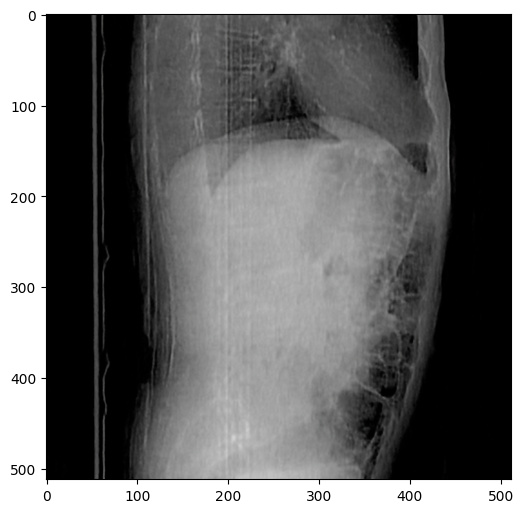

Iteration 1600 PSNR history: [33.38891490278722, 33.61823161510364, 33.45760270849081, 33.51620438213403, 33.48919730125223, 33.6831098362877, 33.38853557189704, 33.557905541960594, 33.22955724873572, 33.67622305340856, 33.353024322037264, 33.66956239823566, 33.11153224805264, 33.70680707565998, 33.31913880160191, 33.59428505140128, 33.53154275548436, 33.645088593579764, 33.41115956597246, 33.72354399343538, 33.300911272305086, 33.65785611258562, 33.55410392222544, 33.66401566769051, 33.58694979208976, 33.42665802062835, 33.550716167215676, 33.55600086877429, 33.72659080186545, 33.49292031723571, 33.702785919518554, 33.78529783729972, 33.54262791803813, 33.43593560871255, 33.7915491101206, 33.649370299938965, 33.548981679143964, 33.64021238726795, 33.55845925814644, 33.46869016057514, 33.7405624421067, 33.442134180162284, 33.58172634592882, 33.27384605438751, 33.74511815882996, 33.38763206113345, 33.772653882263214, 33.55659633563882, 33.55671564684001, 33.679596155132586, 33.591390240

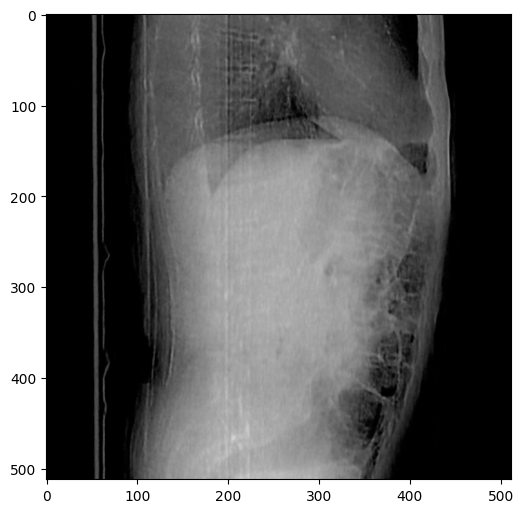

Iteration 1700 PSNR history: [33.83715349154561, 33.860614184885556, 33.89994086827552, 33.838463703022754, 33.8813800192569, 33.838893409081926, 33.90589526714487, 33.86286030089097, 33.89268878762669, 33.94474073953235, 33.570517315588134, 33.96517582808797, 33.38608085259447, 33.860037181769144, 33.74996526905703, 33.80002864090654, 33.68156246046559, 33.8179926335267, 33.708813368855544, 33.84754512380646, 33.710188451185395, 33.81337421557585, 33.66091886126139, 33.895070634291656, 33.69844199404056, 33.88413170584493, 33.53806790418241, 33.900541592015955, 33.76764261909323, 33.956450907236466, 33.843498340928534, 33.905580009373445, 33.70442701577684, 33.89170102414621, 33.91087095608238, 34.020166190241426, 33.79672764041817, 33.834020649592816, 33.50965051023761, 33.9177943200427, 33.826080220759806, 33.941331747891724, 33.665314466338764, 33.925740797354976, 33.761249821252996, 33.912525933152914, 33.831171807854794, 33.94963848888301, 33.84634300201644, 33.963462158258054, 3

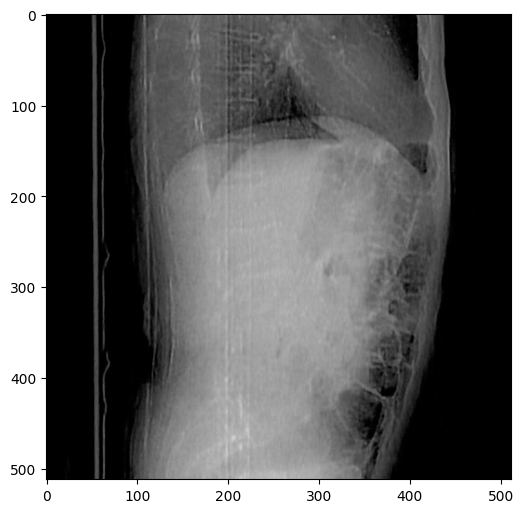

Iteration 1800 PSNR history: [33.899857307777346, 33.98571232211607, 33.99811851484226, 33.975884329562895, 33.95553889082414, 33.97939762751298, 33.97610894172757, 34.12076799078926, 34.05841873175645, 34.04527977492802, 34.183666919092616, 34.165198246434656, 34.06100929513905, 33.99454872893601, 34.10836913028901, 33.87051177030291, 34.085864443448116, 33.90568054923898, 34.06682465016317, 33.92262091407379, 34.13020456642502, 33.873610185159514, 34.027407556443215, 34.099410066124015, 34.13489773370279, 33.97734399698703, 34.037782028806745, 34.07383140287314, 34.103643105227654, 33.833709312955435, 34.172869864858114, 33.57980623035655, 33.87712086432329, 33.969180193232205, 33.700699569619005, 34.02885743366507, 33.92447200894546, 33.945547238178996, 33.69729315358231, 33.96328388579421, 33.89658517448015, 34.09648035943498, 34.07528226225855, 34.00384847593061, 34.16467344821223, 33.96289434887437, 33.98472248918074, 33.97080480752008, 33.97513614364324, 34.04672521618761, 33.96

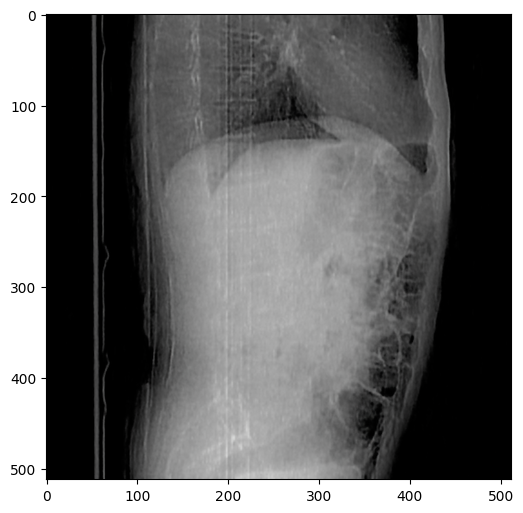

Iteration 1900 PSNR history: [34.22479972382797, 33.58382282614024, 34.04554373688301, 33.823954161481055, 34.14609982750712, 33.83329595700916, 34.12092945243071, 33.86548359113756, 34.186962045648905, 33.977434486541085, 34.291514433995964, 34.041210515863945, 34.260966141734116, 34.11023263846332, 34.10834668949968, 34.027597964619034, 34.24277230295416, 34.02669570658639, 34.31546914685097, 34.167914227615775, 34.14243705726431, 34.17223945272009, 34.29433116007771, 34.23808415321064, 34.161442087897754, 34.227672993471195, 34.138024373654616, 34.29367175939457, 33.95541215140544, 34.205233278654525, 34.165842684289885, 34.07780242969264, 34.08074169377629, 34.222001778735105, 33.93276340966722, 34.252972292138566, 34.003338701020326, 34.20620766343309, 33.79443363741079, 34.241953127351636, 33.91760652509813, 34.20303224118952, 34.063334974979036, 34.144917591078, 33.9157250692275, 34.18201031270466, 34.06525042645055, 34.24469372160602, 34.207182618806364, 33.9884366812234, 34.17

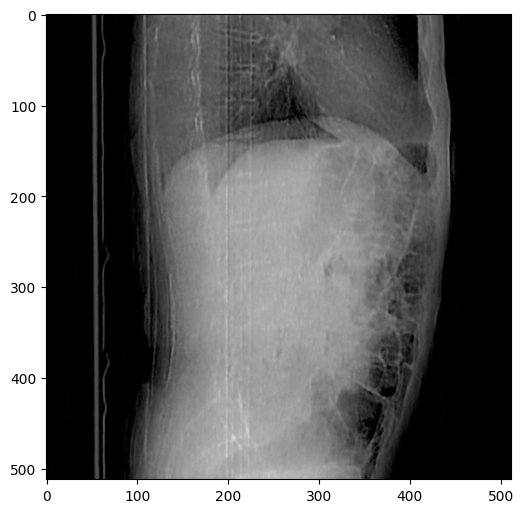

Iteration 2000 PSNR history: [34.42911398802801, 34.46522491588704, 34.196033048260695, 34.44396495282571, 34.55339487870687, 34.4732626313243, 34.46951181317657, 34.5477470967523, 34.434971845739206, 34.57178383165488, 34.44996722942442, 34.40301555987745, 34.42386038903476, 34.45982762458845, 34.47046550869117, 34.491644078427214, 34.50773798906433, 34.51600116216068, 34.374008100122545, 34.52328963530444, 34.42254728545746, 34.367221323268794, 34.415933259264335, 34.548724310902614, 34.44488486958201, 34.49942825275195, 34.25008024210166, 34.43552631151137, 34.37285673138619, 34.353490418812285, 34.07480100962, 34.34361463129538, 34.44851609266076, 34.46836899200935, 34.34053538657662, 34.41529571676347, 34.41202285454641, 34.34052241170606, 34.403093580296755, 34.32969153944586, 34.5710373771912, 34.47418759588991, 34.386466556047964, 34.483502971007645, 34.469337582012116, 34.443985122160704, 34.497411805203456, 34.53616535063606, 34.50733396619678, 34.571967717558664, 34.55190061

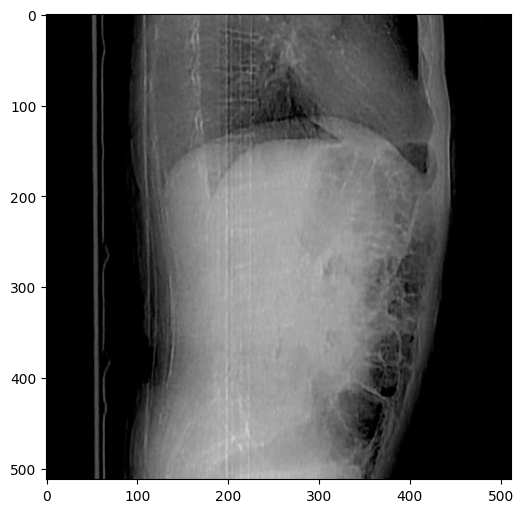

Iteration 2100 PSNR history: [34.420852100903055, 34.69107658474432, 34.277487011539954, 34.43946362699898, 34.59100339467169, 34.618087771697645, 34.57662977715315, 34.662655757461536, 34.50834113518107, 34.63591965997306, 34.58827665343356, 34.62315305159714, 34.27051839415618, 34.64142455924416, 34.50176115471811, 34.370938828126945, 34.64230218229589, 34.571157113581314, 34.44001170334094, 34.41780101044992, 34.63802188856676, 34.2933999067063, 34.643028125261665, 34.31761127738462, 34.47824285837438, 34.448678466712536, 34.725211967538236, 34.459765250599766, 34.608627256564745, 34.48667117046506, 34.687554151419356, 34.41015051156939, 34.655669317454525, 34.41825757555034, 34.55214063683668, 34.60470120846368, 34.62045797819583, 34.76539305241505, 34.5992168453585, 34.7947284098348, 34.694965530115965, 34.70353010164605, 34.69109339433004, 34.65477241548776, 34.545930488555584, 34.707080857063154, 34.68580307328109, 34.75429795466515, 34.77680506021382, 34.77175296635111, 34.7977

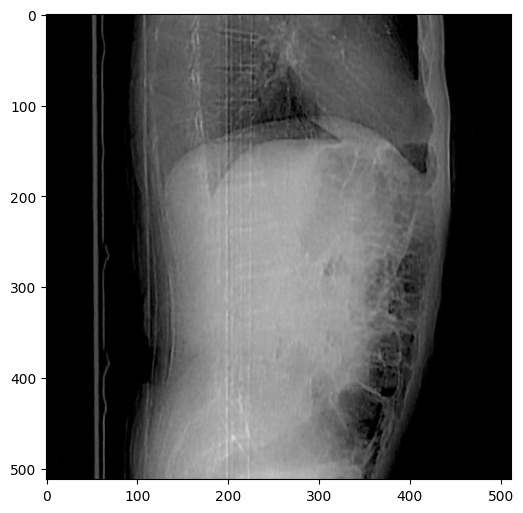

Iteration 2200 PSNR history: [34.895624528933105, 34.86071090953297, 34.879543804345104, 34.882210526358755, 34.747562188427715, 34.8858212074992, 34.910317788193204, 34.781835031528814, 34.887265976284084, 34.826806673886836, 34.74391512365712, 34.85913407581186, 34.8526534231556, 34.9123546889798, 34.83717920121106, 34.69573275783014, 34.874925522919035, 34.69953296991321, 34.86884894762361, 34.73979084035188, 34.93503320564325, 34.756548153306085, 34.897273792025075, 34.82836366847305, 34.94934134362728, 34.87733648566938, 34.826996968574264, 34.96083369289166, 34.8542854397633, 34.924809294952, 34.91165792232164, 34.819951907620464, 34.84795737275154, 34.92315153459556, 34.98531508760677, 34.80217883873886, 34.92400407588222, 34.79291242660036, 34.86859288280151, 34.874149973094106, 34.741074900235084, 34.881943702624426, 34.87701604887674, 34.89421180820925, 34.84454124174546, 34.69506048832254, 34.961993897929005, 34.55232765512414, 34.89199932788507, 34.71398168460211, 34.803652

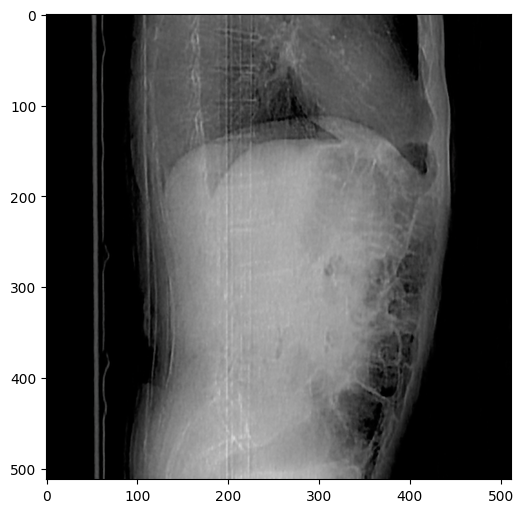

Iteration 2300 PSNR history: [35.10661794470213, 34.925587735232696, 35.068858988689584, 35.02658579363902, 34.91019621959519, 35.054372665721296, 35.05338661490404, 35.00656766661706, 35.04754941585999, 34.96245184281562, 35.17332234721962, 34.98788797725787, 34.95249317065832, 35.055503154507704, 35.05621179931402, 35.06156963385217, 35.011999185576755, 34.95271167471407, 35.07362531703455, 34.90779288489644, 35.05473552749712, 35.13662447242009, 35.01135277845308, 35.08683018531683, 34.969245372407556, 35.131172455077674, 35.02939755161724, 35.07053651599328, 35.07772335553397, 35.13080930790283, 35.10393658030384, 35.14119935098478, 35.17483251883689, 35.063603785241355, 35.146710994956656, 35.12145083497756, 35.04788733537107, 35.16595837854709, 35.10471403828613, 35.175651714711385, 35.15044870549961, 35.16263980701026, 35.112858916147694, 35.115560501464195, 35.107577766611, 35.1229384319962, 35.1020400215136, 35.168968123653606, 35.072656810386455, 35.16151048731499, 35.1630840

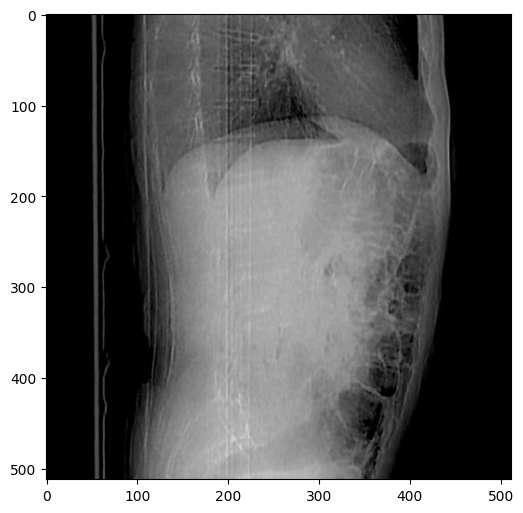

Iteration 2400 PSNR history: [35.17480848450097, 35.10103223715244, 35.15025097786162, 35.190066904873454, 35.281142855358006, 35.15239020878597, 35.080919224750744, 35.010052178943404, 35.18989914776491, 35.21106230866129, 35.16221489580549, 35.15501782821087, 35.133682885039285, 35.12198404298548, 35.078778428868645, 35.14975006592944, 35.12190340762964, 35.11878907030136, 35.214712494201834, 35.20059261545246, 35.25508038679056, 35.122504523080444, 35.09775053039942, 35.13580534363417, 35.04911443757801, 34.98746464816139, 35.13265189680669, 35.16258727462818, 35.1773080379257, 35.18189969221187, 35.157858532554755, 35.1296501978583, 35.095671177016165, 35.227373812307, 35.05795570299324, 35.23881182442175, 35.033687122854644, 35.08638153522851, 34.90985863176419, 34.64786078471552, 35.30242775445042, 34.5757388646565, 35.14178107137442, 34.856311412831346, 34.978866750371594, 35.09935715018147, 34.814171921378986, 35.17176288436394, 34.70529728135796, 35.306371608660704, 34.9002973

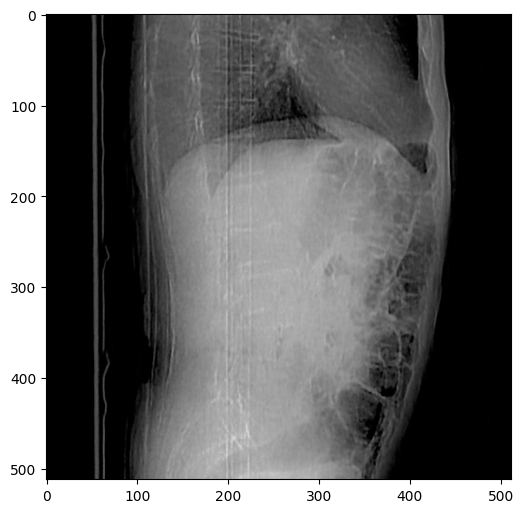

Iteration 2500 PSNR history: [35.30685289552521, 35.37393442607571, 35.22824830755716, 35.36481545559542, 35.3528859638993, 35.29611797644486, 35.38783388206489, 35.3232152251653, 35.26001015277592, 35.19703203331255, 35.38977921379804, 35.37089809355974, 35.2955330661482, 35.384339333505835, 35.294930991081664, 35.43020949851607, 35.30604221347301, 35.36038242413696, 35.16515201109159, 35.39161032442783, 35.282519859248616, 35.45885587447441, 35.394426419917494, 35.41898218283192, 35.27647639714221, 35.436219063528455, 35.336778075026615, 35.2670707170609, 35.34835515764993, 35.162084060990196, 35.19640128339531, 35.387119585877116, 35.170392850567985, 35.37684635480087, 35.06993942464726, 35.51466603253943, 35.10526061232593, 35.3062724108503, 35.21835490810952, 35.345833589022895, 35.367617411372876, 35.399490332271036, 35.39907011218118, 35.221571286224986, 35.44757969300885, 35.28937498706459, 35.30250733984603, 35.32095541521555, 35.263350108558456, 35.284358127385346, 35.4297954

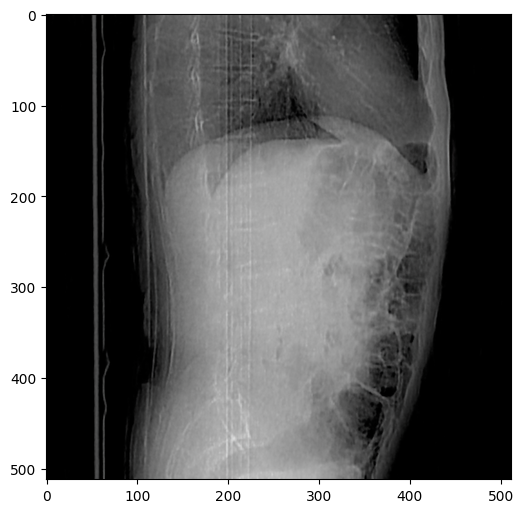

Iteration 2600 PSNR history: [35.46183089161059, 35.33437747348352, 35.43434334441211, 35.55226975701882, 35.455223371687545, 35.527187022668905, 35.46009205984585, 35.508264238470424, 35.3269893065999, 35.56345775322907, 35.28605841673853, 35.57877795813806, 35.24418883220577, 35.49202951368008, 35.44478617506541, 35.329292982660235, 35.487430604110635, 35.348396197289695, 35.60514822412097, 35.48084992378925, 35.560761612235126, 35.270867479352844, 35.2597443933698, 35.529528471513586, 35.37043777728723, 35.16997397741536, 35.3902483668837, 35.25671297850675, 35.302616670731595, 35.25846702990863, 35.46129971775584, 35.242190628741305, 35.47472559600116, 35.50447342285382, 35.54362847031724, 35.43063338506084, 35.557187085843005, 35.481588603958386, 35.52437321706475, 35.52814947167878, 35.43468518860942, 35.42410976368059, 35.08285216865693, 35.37070476206192, 35.347230541300995, 35.31425316771441, 35.49252902902038, 35.42057799294436, 35.549527144609044, 35.41733261133323, 35.59062

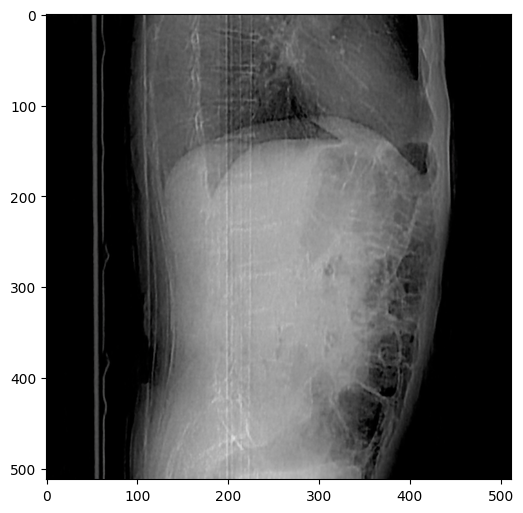

Iteration 2700 PSNR history: [35.607956825333744, 35.654358480818324, 35.559088092167215, 35.490903380098324, 35.73997736801195, 35.57723946228308, 35.696538745608784, 35.720796568045714, 35.535310349745885, 35.70925408279611, 35.63802409726614, 35.677881899147046, 35.65539018733458, 35.50006959038319, 35.73342198113187, 35.49809943234252, 35.718443271211704, 35.69264040234712, 35.640239268749376, 35.684869491776524, 35.6948326317291, 35.73856997184565, 35.591380086581836, 35.580784947926524, 35.647889994488416, 35.75847382466305, 35.765848570994095, 35.79813792943803, 35.67915580569375, 35.81046366274914, 35.71344928370392, 35.71760204653812, 35.69686287017783, 35.795503491415545, 35.778392303733554, 35.71568175495348, 35.76303463905772, 35.78493803270848, 35.77078564233778, 35.77845895617201, 35.75374721070454, 35.78435712945912, 35.62220307616735, 35.7789221088206, 35.64814141865816, 35.59589780926798, 35.76340344985823, 35.62137518177568, 35.680862873011975, 35.83843771804506, 35.6

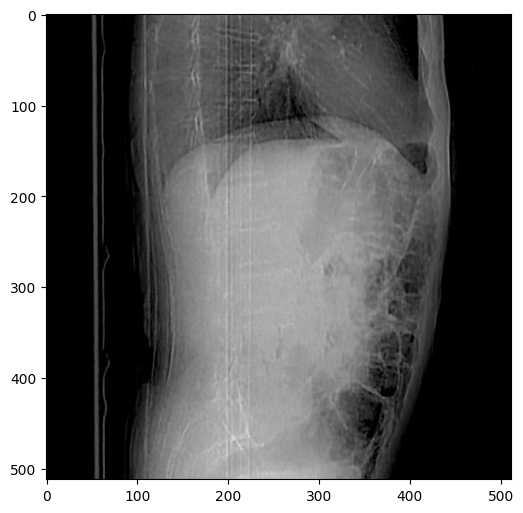

Iteration 2800 PSNR history: [35.91747625869688, 35.78693083362509, 35.82708220148681, 35.77016323594396, 35.68435982923366, 35.840662817733644, 35.8372016704027, 35.80719708271249, 35.866964721388584, 35.833931524051025, 35.940576131355485, 35.85806867746024, 35.806761741486795, 35.980207029486294, 35.70685222904568, 35.89423818575228, 35.95727148476517, 35.91889964058646, 35.880659769810876, 35.793793677828376, 35.88791462917602, 35.904865618432815, 35.87570275747942, 35.85753997938309, 35.87699541396634, 35.84109317558753, 35.59656956272116, 35.74820365466443, 35.78922920143459, 35.82258567516252, 35.70856235431787, 35.502479036865765, 35.82523304849834, 35.28541953156648, 35.471996158587125, 35.51335201080737, 35.18324754330603, 35.74069214558928, 35.378860595276464, 35.59955315602487, 35.787049483414435, 35.600740139173766, 35.53315209649455, 35.04002837401762, 35.65334900193561, 35.286315797899974, 35.58071338222757, 35.55660221391178, 35.449219041711366, 35.728023157933706, 35.0

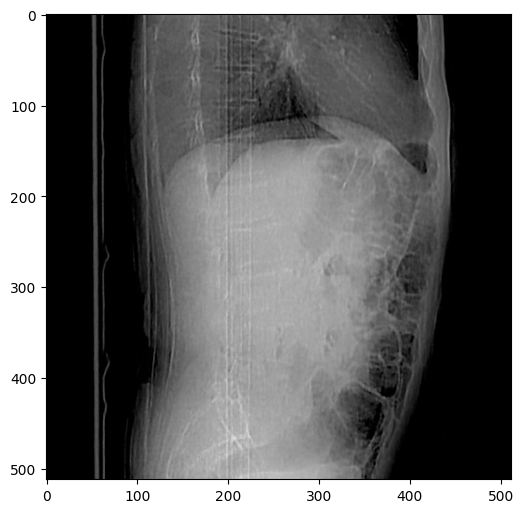

Iteration 2900 PSNR history: [35.77626236728956, 35.983841383763384, 36.03519922640154, 35.98666535183894, 35.93228898898365, 35.97694340214616, 35.96239295656505, 35.8613186933751, 36.01978347607508, 35.803949193330844, 35.836870221962585, 35.9713221582564, 35.77541086689153, 36.03762926004539, 35.77573896389104, 36.01607996476989, 35.862508268348904, 35.93021781183594, 35.885460847959685, 35.490636401763325, 36.04141918824608, 35.51315472583107, 35.9515984967263, 35.397754517684994, 35.449807627395785, 35.608489647222804, 35.17696665995972, 35.7496966640451, 35.33406962421802, 35.62547605999861, 35.38395439627747, 35.575187162782676, 35.42569212546812, 35.538322783876914, 35.44929398883808, 35.20470116180301, 35.800256154652516, 35.170595583572386, 35.717877332594696, 35.55291792831525, 35.386152303868606, 35.80222430303282, 35.40886423600973, 36.030069967752965, 35.64557665608714, 35.93780076453537, 35.61794080392793, 35.93758158841871, 35.55656122597087, 35.49570902160629, 35.87728

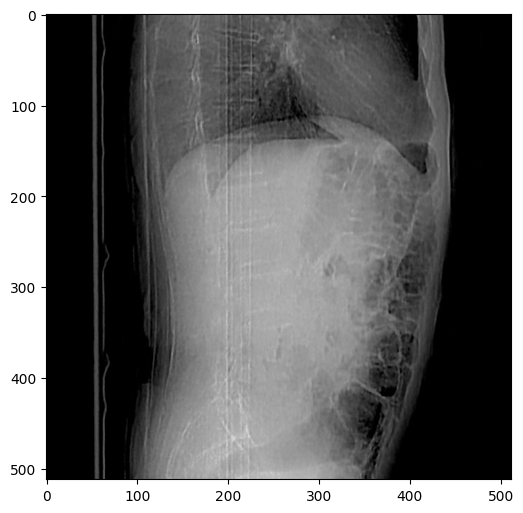

Iteration 3000 PSNR history: [36.1589357191709, 36.145727393459104, 36.011850581711144, 36.093738460530695, 36.055372835251084, 36.100406305691195, 36.11933741376684, 36.13144839668077, 36.18212262780674, 36.131312708977795, 36.16293948004108, 36.118486718557904, 36.134381536631935, 36.11596238601311, 36.192151084546396, 36.12683979965131, 36.0947884368177, 36.22088631676673, 36.208732232934565, 36.11765625327453, 35.92188478336523, 36.211130616970195, 36.084125524938855, 36.16888126204743, 35.97758355489536, 35.95269626485441, 36.15483265283041, 35.81434062800686, 36.15334414811782, 35.76153038481595, 35.986261936445544, 35.97319768035447, 35.99508838785668, 36.095710394935054, 36.061878283360905, 36.052838940683266, 35.99837736948501, 36.13381946803169, 36.073529757910315, 36.074305382475224, 35.956430791658335, 36.16317800369718, 36.073462125028364, 36.19545066262724, 36.03481467640292, 36.056930469744145, 35.83760941020634, 36.22615208254297, 35.65692597903383, 36.17802551439987, 3

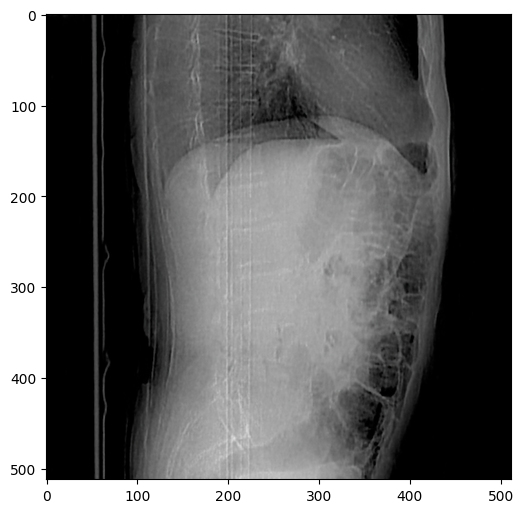

Iteration 3100 PSNR history: [36.239305975757105, 36.20702203196068, 36.240466976487596, 36.30100910044532, 36.265347969874476, 36.2117576496706, 36.299996575114484, 36.23586473334016, 36.28072920249061, 36.326752133098395, 36.168026978951666, 36.31031875325, 36.30136722888333, 36.27817858860972, 36.175727364490086, 36.2652983428555, 36.24362915912839, 36.31516120415934, 36.243764088445396, 36.33331354107543, 36.270260073190606, 36.34660242891311, 36.39347033796057, 36.29358116868849, 36.346862710469374, 36.30447720998845, 36.341055520142476, 36.31290892234271, 36.3058323128836, 36.34422839089019, 36.28907889312379, 36.3008836552479, 36.26607190400172, 36.385460841833755, 36.091293887763435, 36.18708935917226, 36.41129838458386, 36.27171247194462, 36.380617641406864, 36.31430409929368, 36.313534918968124, 36.301747574682665, 36.314908174494846, 36.24146405182581, 36.309828667521195, 36.32916341653853, 36.22922767737906, 36.29784338720053, 36.11717282214498, 36.311024883582384, 36.29722

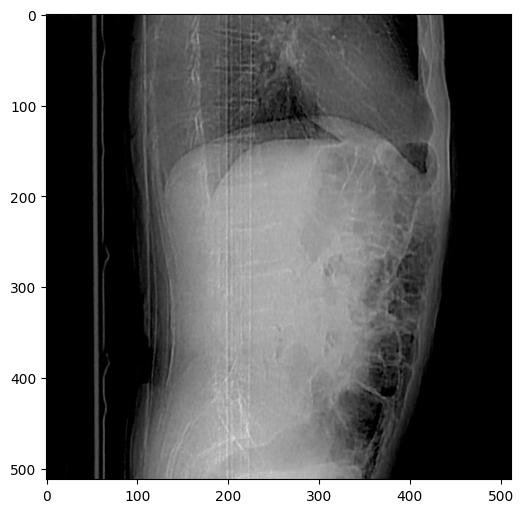

Iteration 3200 PSNR history: [35.907590155360126, 36.1711993768088, 36.486734636376596, 36.328951128797215, 36.404126942715685, 36.26452090504701, 36.48602607118504, 36.28624117482556, 36.214896104275184, 36.31999524933421, 35.90443071756455, 36.270587188125546, 36.371038161629244, 36.29388939760319, 36.318840384365586, 36.31275069278751, 36.27113360514264, 36.3937426747694, 36.31679133376722, 36.439147302708605, 36.45934244770026, 36.44414050600454, 36.42463261319307, 36.31964108371706, 36.36641662273861, 36.41034308127712, 36.36974835558451, 36.25688911447782, 36.400595437388276, 36.383214580925326, 36.34288900733738, 36.44600260848357, 36.41631376091042, 36.38595810606521, 36.49335363226501, 36.37727689308119, 36.417742351129604, 36.4101071609674, 36.40187521422057, 36.461384599579326, 36.46615362513892, 36.47357704034514, 36.45111140743954, 36.446769397038935, 36.43270341702443, 36.453627081896094, 36.43898733759026, 36.486568914574335, 36.45550243962214, 36.43638612916132, 36.2859

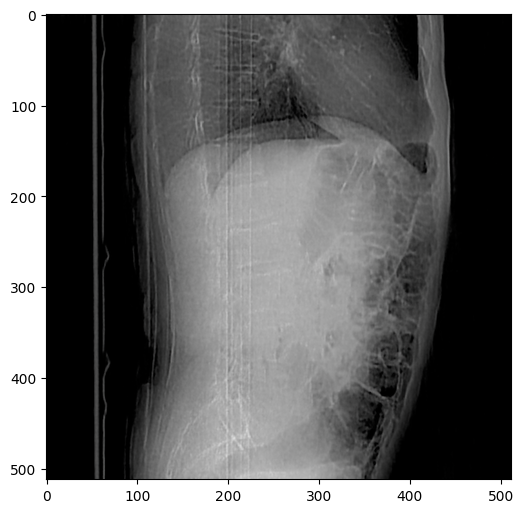

Iteration 3300 PSNR history: [36.426178145015236, 36.502447572614905, 36.396827756637194, 36.31982328183709, 36.47919548708538, 36.39470586874661, 36.375315161693024, 36.56680793854676, 36.536896599477025, 36.55756755787833, 36.53425217911907, 36.592919167897485, 36.52604824724646, 36.55410371491104, 36.5844893184388, 36.42800643725718, 36.590384455887175, 36.486303841881956, 36.53170368530785, 36.63384119477297, 36.48495690823295, 36.62383351329598, 36.551221500013604, 36.581923018237745, 36.52387899583463, 36.68372721333077, 36.48630677010707, 36.65314449159869, 36.20357311626917, 36.16365734511153, 36.546849789032066, 36.4959932909018, 36.49711189293281, 36.56923720841219, 36.24731255011397, 36.58202900334831, 36.38164584280621, 36.428004583615206, 36.51878739916728, 36.3203658938985, 36.51217067149372, 36.44084904938716, 36.33093833518635, 36.58002646310759, 36.46060727304771, 36.458942788913376, 36.58251507654623, 36.540520297222756, 36.35882837959273, 36.573170775376724, 36.45892

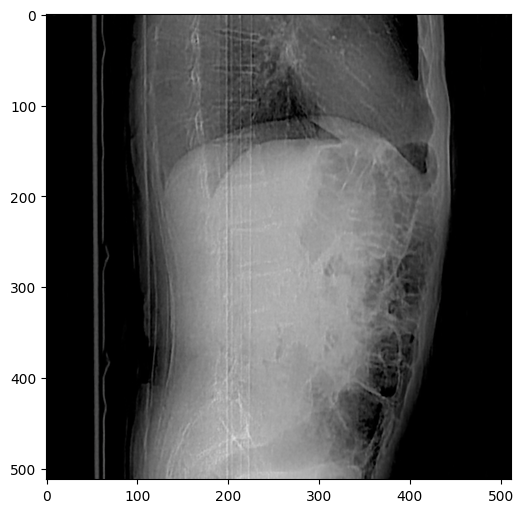

Iteration 3400 PSNR history: [36.52527959902419, 36.3644897674392, 36.36671308668565, 36.65790963024463, 36.431101990979286, 36.622813583290096, 36.578988917389616, 36.59869451460918, 36.60853487956654, 36.56692274995753, 36.66758082135785, 36.579729525552295, 36.57907757752436, 36.516899034561405, 36.61221420200855, 36.66262657981119, 36.59778880739666, 36.63932851450354, 36.72115141099777, 36.65695339267281, 36.736244449320154, 36.680902728518625, 36.758647921851804, 36.69104306627063, 36.51310908846781, 36.56246667751627, 36.60991641386331, 36.41799377969907, 36.50499291106717, 36.79316623477542, 36.602050981909294, 36.68808794203389, 36.62609872117077, 36.73287264355057, 36.63479764532073, 36.625065786749865, 36.64207798022221, 36.670865264608736, 36.64068988929591, 36.709986049242346, 36.57475024591943, 36.60861773470379, 36.629211123688414, 36.55230412010373, 36.208875751040345, 36.64692384438465, 36.410291371229505, 36.5242367930594, 36.515063144209854, 36.517419688444, 36.55675

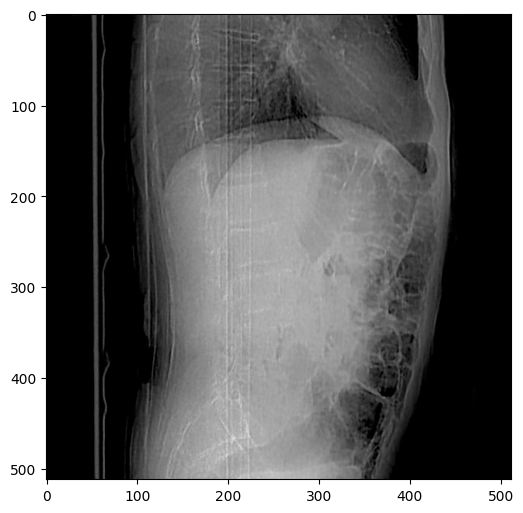

Iteration 3500 PSNR history: [36.62132028469643, 36.758345225190695, 36.396859029629674, 36.65730531366453, 36.58794182779832, 36.54271847518735, 36.835028541151964, 36.58272091180563, 36.77262789594476, 36.61791048543173, 36.669147197276374, 36.75428020696086, 36.62026001405072, 36.84146289167713, 36.65488296069193, 36.63583184799576, 36.756516065092896, 36.661795915185735, 36.796101096588174, 36.6418167381203, 36.74544429318017, 36.797618789876424, 36.777623853256394, 36.7092246222837, 36.86423858310365, 36.69729884044233, 36.61420514099521, 36.84573654479645, 36.629629260388505, 36.73670701161224, 36.73171044982033, 36.68263290935795, 36.87097984320693, 36.577262585912756, 36.80102943822378, 36.73415923641534, 36.725587946710114, 36.773861465561126, 36.78886178722419, 36.81733514122659, 36.821260032186714, 36.67684235043027, 36.80205577047607, 36.71558346457856, 36.52671994704985, 36.662094270732965, 36.74827383960537, 36.431763212710884, 36.780447323057516, 36.69258562993454, 36.32

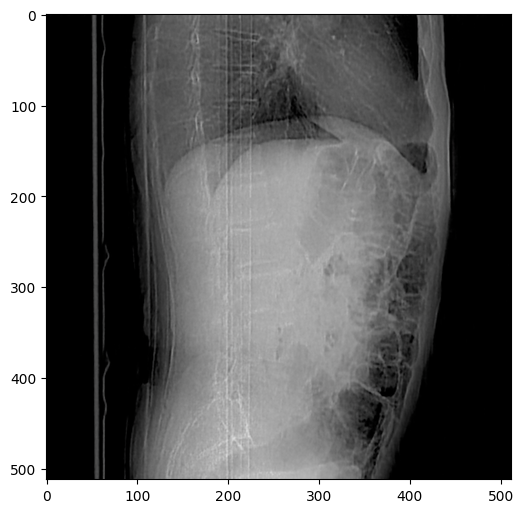

Iteration 3600 PSNR history: [36.64932590616269, 36.855963317266166, 36.66799136612515, 36.73900411335906, 36.78902625430769, 36.44758413479372, 36.827858292236144, 36.54933708154808, 36.63176250894681, 36.881728519280244, 36.73619550310096, 36.654748313850334, 36.758924395859815, 36.59603971921703, 36.810397014111714, 36.87772988178813, 36.73138374718448, 36.875407650215294, 36.862561068050404, 36.70003079386836, 36.760734751582774, 36.79632620185767, 36.75128069643149, 36.674126396304544, 36.84006626084526, 36.773094513985534, 36.754938419659645, 36.864004780166866, 36.64083358855977, 36.70852140979877, 36.90754346395221, 36.71273145769501, 36.90658984274758, 36.897858923489814, 36.85015120264142, 36.92920519824731, 36.894910557178285, 36.78661548187458, 36.925515376363215, 36.953736646211794, 36.89495584778137, 36.88086482480075, 36.9331767907369, 36.84959372270083, 36.82969665135951, 36.82546594352913, 36.88622570076863, 37.022632823654945, 36.933882638565976, 36.98582639256299, 36

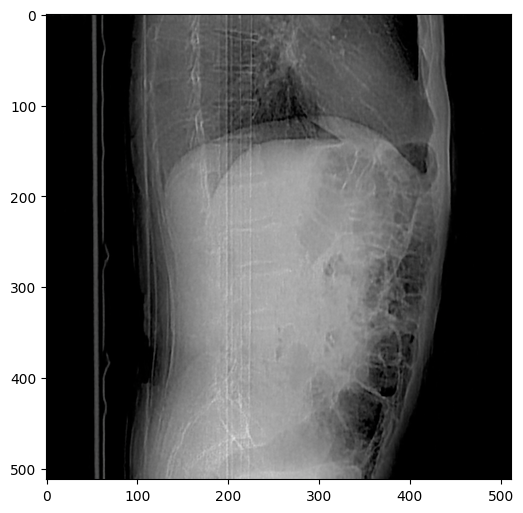

Iteration 3700 PSNR history: [36.77456460343202, 36.91091719237512, 36.96144448102952, 36.838260476234275, 36.90729214139873, 37.086830572635485, 36.83147308860734, 37.003987047508716, 37.03618477262373, 36.96618740474312, 36.97839668788811, 36.888758845163665, 36.836840790963656, 37.04042205807786, 36.748205632191706, 36.82487763100936, 37.01076831994992, 36.830785916837684, 36.876862153656965, 37.01336037928616, 36.93816498229659, 37.0450148462662, 36.91101826984483, 37.009318603851234, 37.02147812878541, 37.030192608464965, 37.11804211793685, 36.90579427883012, 37.112701992949134, 36.979049874799315, 36.989938820328554, 37.07908396880941, 36.88254121153473, 36.98760399327274, 36.903163367954086, 36.93393281849857, 36.95852282679886, 36.80931374588093, 37.10645866581346, 36.80489362389967, 37.07215118950096, 36.86652122641944, 36.68209612954427, 36.75431189560001, 37.0382216173975, 36.84739085700281, 36.75947282559181, 37.046031728563534, 36.90754907409478, 36.95611317211968, 37.0104

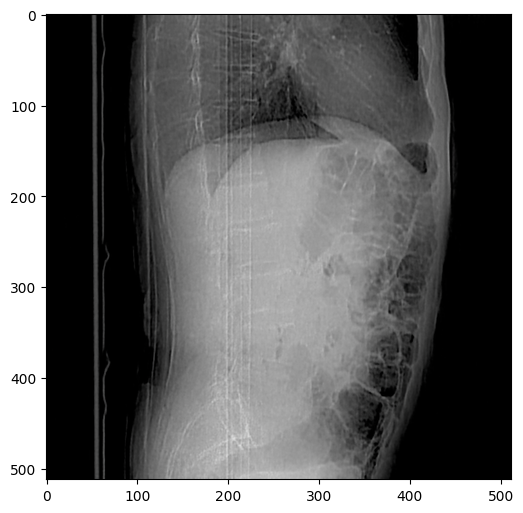

Iteration 3800 PSNR history: [37.033348210837886, 37.02455365107414, 37.13567126967867, 37.12203325840074, 37.13272360354745, 37.13703994503577, 37.15270430136425, 37.07736266338911, 36.993948616111666, 37.105509828562674, 37.13245907400577, 37.120563933105025, 37.134089507812305, 37.07939984966062, 37.18132181735275, 37.04556642417525, 37.07320437417347, 37.152778993722535, 37.064676081429155, 37.22378043623778, 37.12277967944142, 36.9621386327594, 37.237080272384645, 36.93174780909537, 36.91067472615895, 37.072990960659396, 37.00374039111344, 37.135733969538094, 36.99444078375822, 37.07658622733341, 37.17716569148717, 37.00888633453255, 37.19673010894161, 36.93181495710292, 37.12002036855872, 37.026774487852784, 36.826233644489164, 37.12518295934389, 37.14058474781051, 37.0415369665577, 37.19045687045734, 37.08771729550206, 37.15895887328056, 37.143547224758734, 37.15706472789602, 37.23143643976813, 37.132765038330774, 37.23862325827053, 37.040219155036894, 37.11332297912221, 37.0425

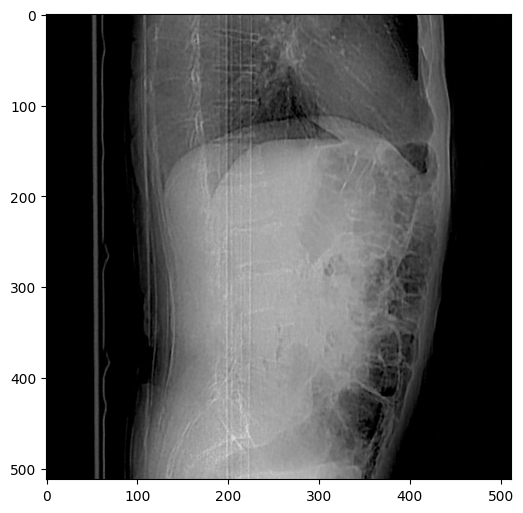

Iteration 3900 PSNR history: [37.23074141054298, 37.25781855191151, 37.22808311001353, 37.31753174183282, 37.17083339955698, 37.30223393989649, 37.2977000894429, 37.23571403643947, 37.2105307138227, 37.3367166337964, 37.064085639240744, 37.20507872499184, 37.248004715624425, 37.29502591460984, 37.230591929578246, 37.22673468812771, 37.25872397893143, 37.24918751142709, 37.20342125678534, 37.272367003668556, 37.28955315129102, 37.212534927386436, 37.27208125289935, 37.21365784167761, 37.326802504976264, 37.14757301121869, 37.3141961208269, 36.948091015746215, 37.25644127085009, 36.97531194639688, 37.126637752870636, 36.866927471924114, 37.22291907577132, 37.03738862311471, 37.26656625250782, 37.141380668175955, 37.128362842328166, 37.38845604898648, 37.20991482254113, 37.27331616754506, 37.30338110520271, 37.34540286089147, 37.30150675370049, 37.28352183430533, 37.242084560757704, 37.1868365869745, 37.26496440419269, 37.16651533531128, 36.93973784800532, 37.144608687271436, 37.190690140

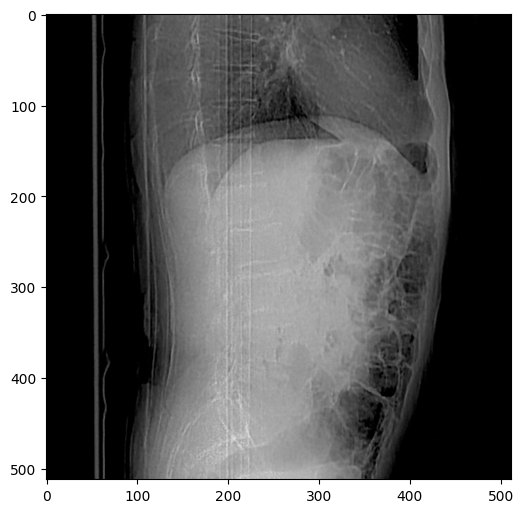

Iteration 4000 PSNR history: [37.133834761240614, 37.063377777583725, 37.31032947619682, 37.03991762437805, 37.08016286784242, 37.211810629629355, 37.008560166499855, 37.232049055735445, 37.28266975228416, 37.30436458725623, 37.257176383572364, 37.13770064314999, 37.337862079046154, 37.239655563856296, 37.27922232528108, 37.36394846009732, 37.28885430600201, 37.137785249091394, 37.263060492730155, 37.23411022240233, 37.085127090189445, 37.34849970605999, 37.24086905371168, 37.26209905246828, 37.3464983705402, 37.24980998422704, 37.16143571243252, 37.356544219853554, 37.11343772256856, 37.40767589906821, 37.203062315606125, 37.207101644183716, 37.37683245632656, 37.014692978074216, 37.233236124772034, 37.364072588492775, 36.934675761192935, 37.38047469483447, 37.124068015603086, 36.72442778170136, 37.05390654793586, 37.2587234891455, 37.4053920398153, 37.218843091182734, 37.107777691013, 37.345178953113084, 37.21694319607846, 37.15462689588631, 37.29934920986139, 37.2918043273463, 37.34

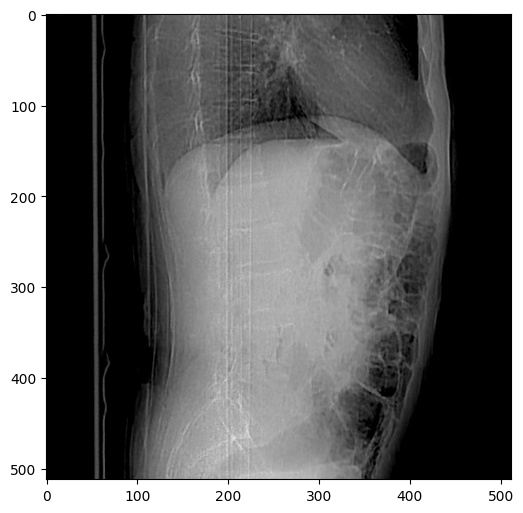

Iteration 4100 PSNR history: [37.51542867554371, 37.46158244915521, 37.45070734749979, 37.44653021006783, 37.3835866366442, 37.484360594158794, 37.42841729743699, 37.51623546258837, 37.46337023502686, 37.52880470287221, 37.4035847294286, 37.408153216886106, 37.48364269779688, 37.345500153294346, 37.117848054872894, 37.23812237706892, 37.467912748688185, 37.32915437744873, 37.15587492083158, 37.463408555968925, 37.51399466717838, 37.346311428623544, 37.49437933771854, 37.334640215187505, 37.477579171570156, 37.3882623321095, 37.39289158418871, 37.464446569649425, 37.30429373587397, 37.55289593230452, 37.502972898348, 37.19017797244335, 37.35070227435783, 37.26598347803854, 37.46155179388022, 37.21570169657327, 37.22938120500293, 37.47622189085193, 37.394790136720886, 37.393423437456676, 37.44335544258439, 37.41982386659473, 37.53070948548826, 37.428505811848055, 37.361386789716434, 37.56528702374791, 37.53799747191656, 37.42325753472409, 37.487940839791975, 37.30317876305246, 37.4616731

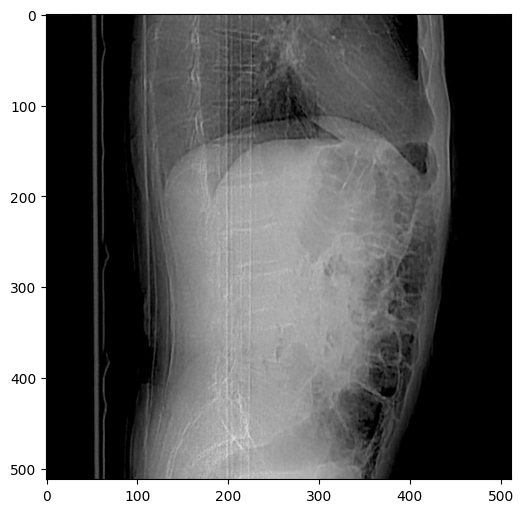

Iteration 4200 PSNR history: [37.322751927148786, 37.593887267269736, 37.321004592712, 37.333054750649055, 37.60387430174917, 37.181594246408835, 37.29497273431666, 37.58240464129253, 37.37397190716149, 37.503373368665, 37.53383599705103, 37.40677490258741, 37.5852927013895, 37.49683333324973, 37.45631592600701, 37.63886426210377, 37.56215161262001, 37.49865971420951, 37.51213548338045, 37.54604061274507, 37.472111571743895, 37.39705558773148, 37.4474084943943, 37.626426551456134, 37.47149128373219, 37.619212940122495, 37.674642294691, 37.6162368996403, 37.53480791814297, 37.53524814210401, 37.66021119263953, 37.56703094046893, 37.62693479193924, 37.681242334812495, 37.5742624152442, 37.54508112912854, 37.61786961125719, 37.48730095758775, 37.34880215447771, 37.479278545473164, 37.565845527432124, 37.58700715925161, 37.392152647342954, 37.66475931981175, 37.542262351853644, 37.51474124121881, 37.56945744101296, 37.6502649783934, 37.64555058743841, 37.558551993012344, 37.44459688857075,

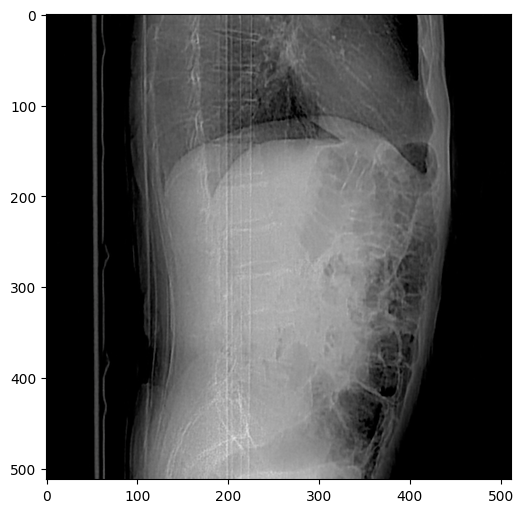

Iteration 4300 PSNR history: [37.72044361495462, 37.620193506251525, 37.810857341968536, 37.68044572497256, 37.73577192286995, 37.69851579747571, 37.579179582212404, 37.69910659254479, 37.598486122238086, 37.16433699221449, 37.33908490222853, 37.80041336063613, 37.47734395214981, 37.61604146185613, 37.677017189918026, 37.59155680818663, 37.67199871958781, 37.69341299614013, 37.6304020632776, 37.65792051703026, 37.66898622460882, 37.578158737256324, 37.50687720027631, 37.56324605124421, 37.7137771231208, 37.60512930947116, 37.659633849382686, 37.754696303935546, 37.62487342338588, 37.57135730372747, 37.442879199415984, 37.559382305103824, 37.58951185642823, 37.66092269836204, 37.56779497467731, 37.733447763007604, 37.6478539159874, 37.54421285558643, 37.75505517385257, 37.51102518419328, 37.65708006177594, 37.59952549332643, 37.57074173980623, 37.68352524163919, 37.6062254679462, 37.742847266043825, 37.6148897930809, 37.70353384727016, 37.72340875799659, 37.69008985960421, 37.7420366747

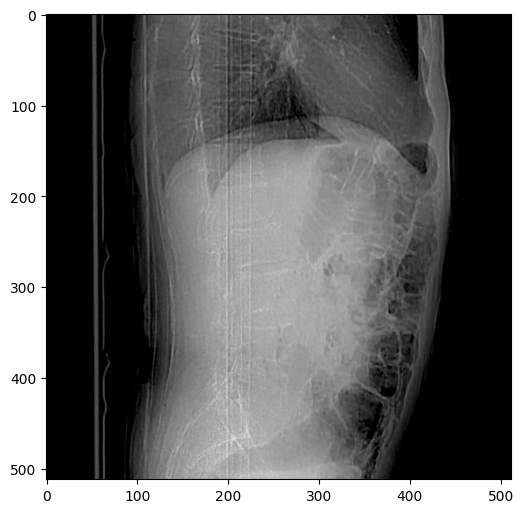

Iteration 4400 PSNR history: [37.54164496719183, 37.600425755543675, 37.480107382195456, 37.654074150199776, 37.70512052353281, 37.71684122686131, 37.73870156195025, 37.744687173789096, 37.642942832189426, 37.82205581898837, 37.61664728610942, 37.396064773800845, 37.42455198448286, 37.61632429463433, 37.82075593037659, 37.547354192544276, 37.49093760886166, 37.5528997886058, 37.68948041359593, 37.68439185573759, 37.68890178422464, 37.842967740720916, 37.79397453509743, 37.80451789858659, 37.81464695362577, 37.86722155137606, 37.87997383879243, 37.76997851190126, 37.771895678998625, 37.82070982632281, 37.78729861268104, 37.737942433331966, 37.722343984461105, 37.79741035368706, 37.823552434941014, 37.62276773245854, 37.76934864841776, 37.84207848978791, 37.78001185793744, 37.816070277505844, 37.6942926174645, 37.83478189585126, 37.84610416495737, 37.74991300514738, 37.71686748537181, 37.84263827742973, 37.91043014584299, 37.818924307761435, 37.90748229841193, 37.83127878366359, 37.85901

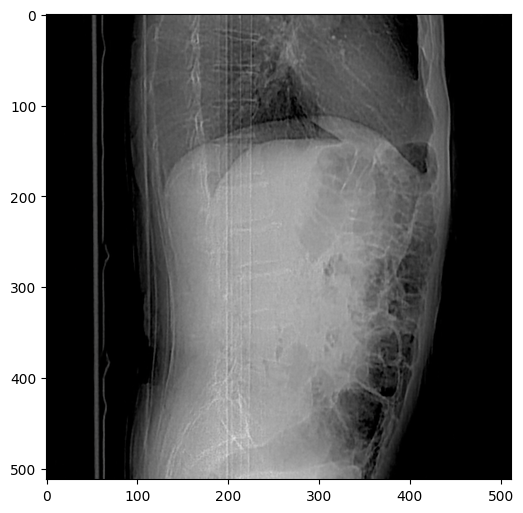

Iteration 4500 PSNR history: [37.63958575343483, 37.87376220735572, 37.47216185248484, 37.78675730442851, 37.64681163079651, 37.43817746910804, 37.83150021756996, 37.78486280770703, 37.667580693379186, 37.84277339321315, 37.8305029530207, 37.732023041389034, 37.91136967207995, 37.765525618535506, 37.61941161866431, 37.82800223705889, 37.93524766299785, 37.73497312531915, 37.9243368634517, 37.93085771473243, 37.861777819631385, 37.85606848928245, 37.849681304624205, 37.82569888003873, 37.92409164410158, 37.93793953848306, 37.734087758600396, 37.77105993614091, 37.88328031620241, 37.94636080793094, 37.92244527731623, 37.69799707266825, 37.57444351087458, 37.82571271561583, 37.89702143044111, 37.61978139539273, 37.75391022662159, 37.91017323264093, 37.73270721219141, 37.877801744146794, 37.828007725422694, 37.785120092072816, 37.8302968867996, 37.95208728797159, 37.62274197236421, 37.72110062998745, 37.8700010579547, 37.485507401220765, 37.76090575345334, 37.77417923531782, 37.52007822105

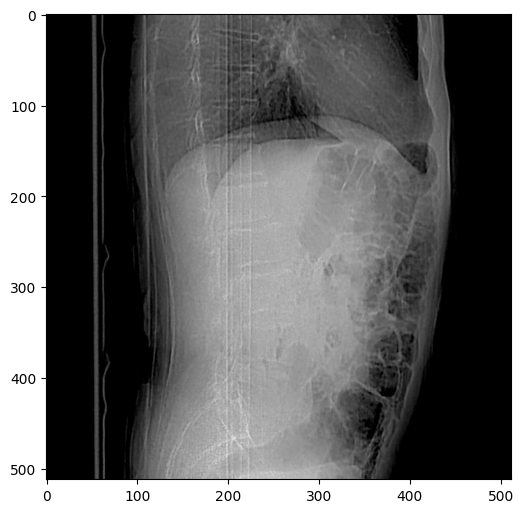

Iteration 4600 PSNR history: [38.00299446280717, 37.953815531838146, 37.968560596709196, 37.93548108774718, 37.98173497826786, 38.03569788567461, 37.90180622625589, 37.78785566474716, 37.9061495785199, 37.99810267170243, 37.8353080379539, 37.635945890096764, 37.981612194905566, 37.98823110752713, 37.91314335791192, 37.761190744409205, 38.03304329049562, 37.94972398318374, 37.85444564310132, 37.96601152876787, 38.075065989645026, 38.01848764119223, 38.0415586201386, 37.92769397966394, 38.08674943241825, 37.74960870647738, 37.89989682547768, 37.945213758409146, 38.09989618506592, 38.0279757548965, 38.05753153505036, 38.045629436359, 37.97746065567752, 37.869174642826366, 38.10975768136896, 37.912330558077215, 37.918807480228736, 38.02721193054153, 38.04239220252326, 37.90646088483285, 37.97087561756035, 37.92557272197716, 37.85303604192797, 37.869977030591016, 37.91681580193424, 37.930805380992254, 37.88918519338905, 37.95602247377256, 37.885222098493344, 37.87882612092539, 37.9815353906

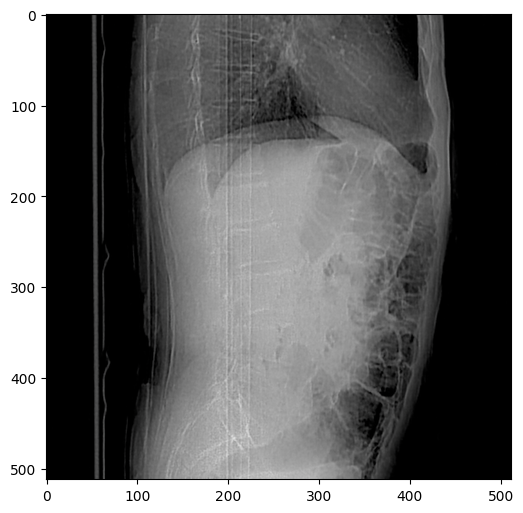

Iteration 4700 PSNR history: [38.162795862069935, 38.10515147178208, 38.13303340942021, 38.05435647929503, 37.96651152309467, 37.96249678088736, 38.06897639750426, 38.17704497410889, 38.139225781124885, 38.02742072017707, 38.18680299692759, 38.15025684399789, 38.10173757305537, 38.109385466586176, 38.061076517228386, 38.07708197142077, 38.0514826595526, 37.99793979400356, 37.99244805839852, 38.121529322906625, 37.95374970024031, 37.65203554260807, 37.720504274135536, 38.04905858055721, 38.02352357919752, 37.608467314863276, 37.89164911706321, 38.01831401762502, 37.92561615601328, 37.79939005799572, 37.8321916306172, 38.08953525959164, 37.977833562610655, 38.08239339170114, 37.9893725330822, 38.154616635400174, 38.15475377557158, 38.10065744559725, 38.184536598057825, 38.07570942668252, 38.10210088401192, 38.06300913218727, 38.1844361790035, 38.12241658325036, 38.0442021641535, 38.080865603271654, 38.17957797513985, 38.0358199894019, 38.05871579291768, 38.07482949935762, 38.118045224700

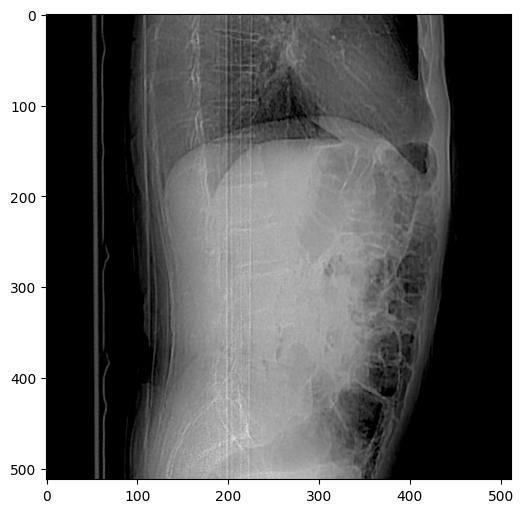

Iteration 4800 PSNR history: [38.160565150584716, 38.15851582896661, 38.17984530183477, 38.11359227850812, 38.06378773731973, 38.20533635753343, 38.25949840071605, 38.03248474078079, 38.07913941118238, 38.12805518196675, 37.982372041523305, 38.14119326044141, 38.12242361256766, 37.943652920620956, 37.9592944978192, 38.05415378296702, 38.03429546942401, 38.16042521663286, 38.123743186861496, 38.12422103817634, 38.036971643099434, 38.256226663754674, 38.071266045193454, 38.03659773566997, 38.15102843417915, 38.14512533510255, 37.81369652454358, 37.92361646841403, 37.96666391944062, 37.91907303149985, 38.10845623032807, 38.07925085575941, 37.92740667658714, 37.9320807472503, 38.19524772070636, 37.950315096375896, 37.99166816708966, 38.12654712187541, 38.11504697566728, 38.23298425514311, 38.1936397637506, 38.17938189977943, 38.087238145267705, 38.20674242433639, 38.15935766265449, 38.2209840916219, 38.25921482714604, 38.14040653741939, 38.05666307016411, 38.27746548179171, 38.111726962046

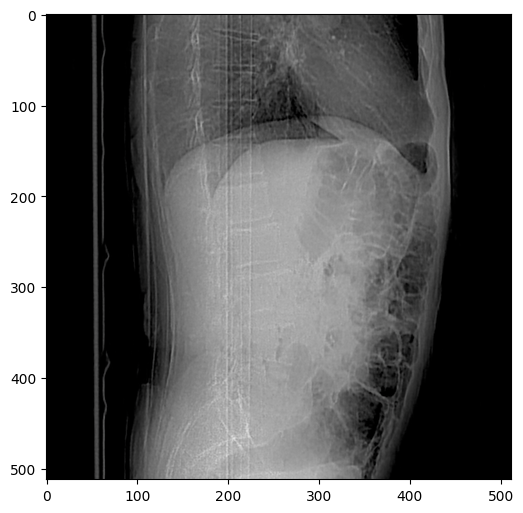

Iteration 4900 PSNR history: [38.250591211854, 38.10161443982724, 38.13625995043577, 38.308937244745124, 38.11124899432391, 38.171400401722, 38.32108452190297, 38.259185303500345, 38.19812395422749, 38.24538213927371, 38.37414046900785, 38.137975416396294, 37.87951614059034, 38.05356292301965, 38.27971316049498, 38.350433428797224, 38.11688123064717, 37.98504390795753, 38.145732267795026, 38.396689400999946, 38.25152920170902, 37.958324215253924, 38.19688620485697, 38.184709221292756, 37.77164767514038, 37.94207802671582, 38.27956390272766, 38.13080501874164, 38.06139952813831, 38.33089782652415, 38.312481794917815, 38.218542893033074, 38.37638809034036, 38.217904977811905, 38.31855359452565, 38.416320380183244, 38.344884075126416, 38.31105611758136, 38.35199949198207, 38.47758466595542, 38.41577800080188, 38.38368413783007, 38.40724132195802, 38.39413390960654, 38.416958920091666, 38.30074552539297, 38.194710807757914, 38.31168608477634, 38.47820600031206, 38.27491486663615, 38.130661

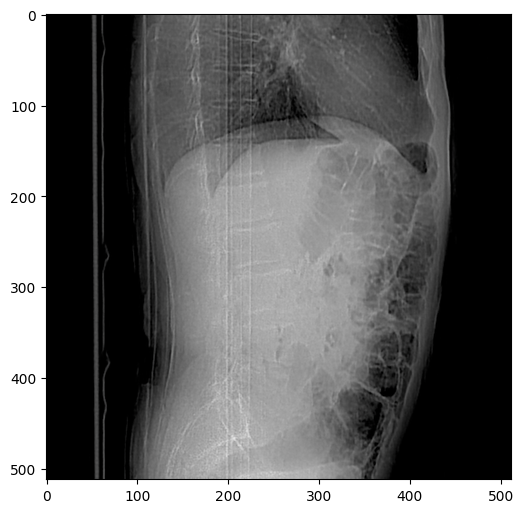

Iteration 5000 PSNR history: [38.49343715236836, 38.459546685474876, 38.35552244120961, 38.448030450295015, 38.312862751055434, 38.3622188104878, 38.44960788786929, 38.221317457679376, 37.98808661595159, 38.18523258247433, 38.41153764788983, 38.311608706692134, 38.20001682883653, 38.24869915820203, 38.106951536419814, 38.4601870586506, 38.39360605413119, 38.25161092742267, 38.31059686302295, 38.431380540215514, 38.43062738398438, 38.272022624481664, 38.25602001677873, 38.45983177340534, 38.50189524430881, 38.242225219070455, 38.1243495301449, 38.3595116408061, 38.52846522384468, 38.40903426126861, 38.29837386265973, 38.40256220456642, 38.51560696352298, 38.4320991742422, 38.43264000753421, 38.45723975479687, 38.5583906804694, 38.524179882414046, 38.53329274528561, 38.47175337508028, 38.48246767694786, 38.371908805491515, 38.373666628675956, 38.585909067019806, 38.48169305443297, 38.561128926239405, 38.487769976592496, 38.544253430782966, 38.52102816437082, 38.552732943584154, 38.487929

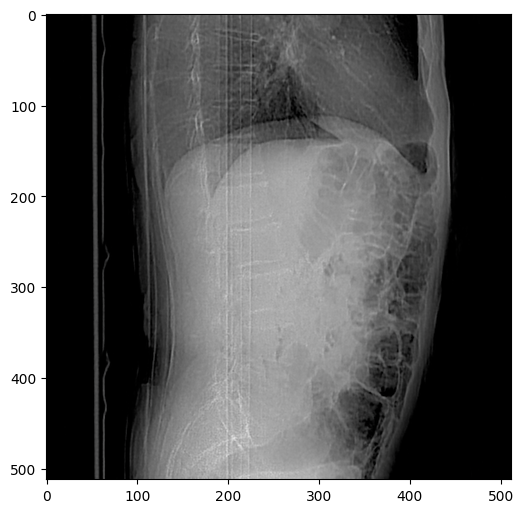

Iteration 5100 PSNR history: [38.501631988499376, 38.38680059365743, 38.57211974000802, 38.65064828314503, 38.56959219989019, 38.590639380105, 38.42547035928937, 38.429347603026976, 38.409687393597125, 38.41541814718227, 38.43657416453253, 38.28071001951595, 38.51804069330542, 38.527150211624914, 38.24128027844299, 38.336839707306176, 38.60430357095553, 38.4587602817335, 38.274696008597864, 38.369490206680375, 38.2963191644303, 38.342578927021485, 38.49156463114832, 38.47865502438505, 38.46264835062952, 38.28939212072573, 38.421746138279886, 38.54548134150504, 38.302954677272986, 38.422897046886845, 38.58722506585098, 38.409110932429115, 38.47096542851721, 38.56554627523706, 38.429574634244794, 38.26113415870236, 38.4129870144269, 38.590875451507486, 38.4828006155616, 38.4276276170837, 38.525639719413604, 38.570337867158514, 38.42561098415422, 38.51211681728414, 38.499073108476985, 38.49457183241027, 38.574975861954506, 38.64485738804125, 38.46272818745791, 38.35727636752351, 38.272420

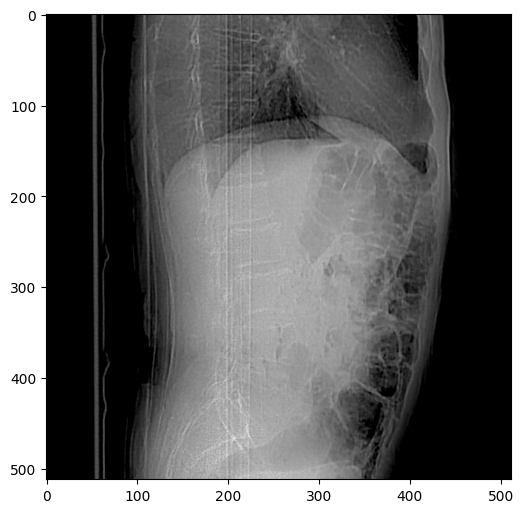

Iteration 5200 PSNR history: [38.24946241698589, 38.34732389047988, 38.2280851207411, 38.448115499037606, 38.53133363662833, 38.43608981578865, 38.48858234157716, 38.36306410302519, 38.22307585159862, 38.24671204971777, 38.41220745785654, 38.31364809446613, 38.30304322472966, 38.3265970225401, 38.53484746073352, 38.3735540015819, 38.25980355948865, 38.560817428980094, 38.307636065155336, 38.06270949488809, 38.32858596734652, 38.38653895485348, 37.757041790232336, 37.6550685867366, 38.43628258677502, 38.400051011813844, 38.11043150785592, 38.126845094977384, 38.6202916570342, 38.02468745844554, 37.8058136842889, 38.350071708343016, 38.549927604559656, 38.25627141957273, 38.23898316166366, 38.66566758056824, 38.38594665583474, 38.4207608569134, 38.60183004241708, 38.57293848025997, 38.48500159783089, 38.44431981605072, 38.67759818466467, 38.567742469812856, 38.622545046203214, 38.68278889765926, 38.599523059791665, 38.63554762484426, 38.6022584269258, 38.662996598826325, 38.6246088813345

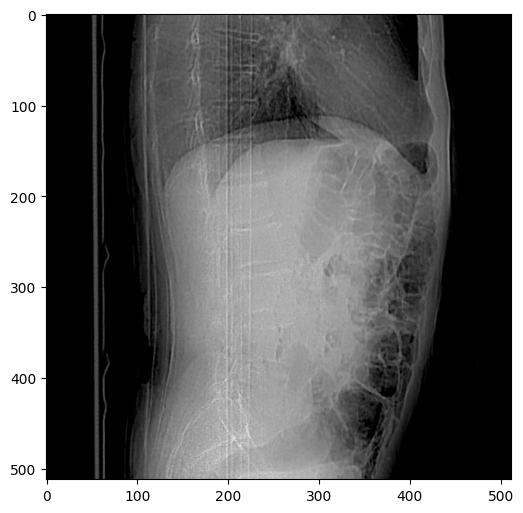

Iteration 5300 PSNR history: [38.764582819237724, 38.71642187519513, 38.76453201159789, 38.82233352538249, 38.505653301525825, 38.30593554080623, 38.58051635255778, 38.82386910446162, 38.598951187146525, 38.511217412967554, 38.70715784775837, 38.61672024902061, 38.44711953673635, 38.471020752682904, 38.759779364334875, 38.716865036988345, 38.650002944915656, 38.74617007414771, 38.76102091858407, 38.68453401985151, 38.482192644327455, 38.6029186099393, 38.71639780259955, 38.40466369312723, 38.43910410096837, 38.47699166142036, 38.5770523899367, 38.5667054303569, 38.52206573349947, 38.67860100961478, 38.17300616461437, 38.212077557453895, 38.52610144816823, 38.649836070677864, 38.15593498999189, 38.5198488686205, 38.59246645876338, 38.55818079079264, 38.49268308339096, 38.63207309974331, 38.65459544750129, 38.630162294885714, 38.535706926676085, 38.63577943531075, 38.7157850983153, 38.76284443287157, 38.787497112499466, 38.65608855685108, 38.662422075223326, 38.69901475559763, 38.7630082

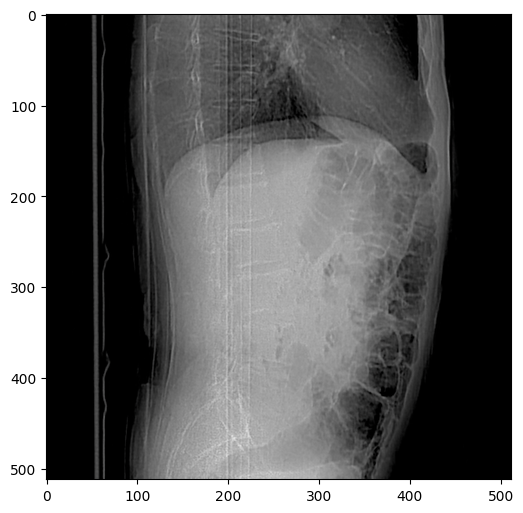

Iteration 5400 PSNR history: [38.65271665473135, 38.63486787151619, 38.562613839652926, 38.66235227354675, 38.767434137566504, 38.65291197265259, 38.58372574405464, 38.80635112417955, 38.763706895426836, 38.7082373732668, 38.830950334591, 38.79899228245052, 38.66133961372019, 38.62411075499388, 38.67504372998461, 38.8007765017727, 38.92349641883499, 38.75977604647831, 38.64280777453314, 38.82154848312871, 38.8818785356011, 38.793375935955126, 38.77732596573096, 38.79331219291652, 38.84346688714766, 38.818211567201026, 38.80972391789331, 38.78553222206442, 38.64280646104731, 38.5956017764397, 38.60252146545101, 38.69754716227521, 38.823194554794334, 38.79564169580154, 38.667502283989954, 38.8350733546291, 38.69023666617653, 38.57455180161643, 38.5375997761864, 38.592288771646025, 38.74953724929904, 38.60187709273718, 38.79740397317923, 38.68236875283509, 38.51469426792981, 38.65802263514513, 38.85057499534258, 38.882659734793044, 38.82619704756194, 38.6953573064479, 38.86167157669483, 3

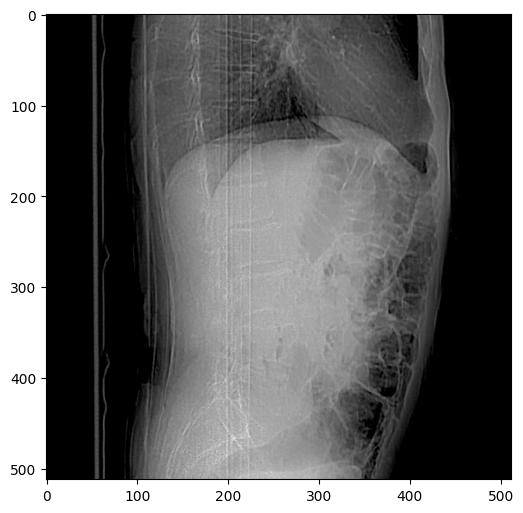

Iteration 5500 PSNR history: [38.791374537931375, 38.852320795205415, 38.93520401911346, 38.92677440587307, 38.93179595764833, 39.00163742520449, 38.96778566647332, 38.823645196042776, 38.59900241509352, 38.88654225617183, 39.03118015339237, 38.67188921705584, 38.58637980838031, 38.82428081981105, 38.97301818130317, 38.893206677648664, 38.84084272120952, 38.88725146809066, 39.0219906071332, 38.92335851937608, 38.97062002338437, 38.94360684063304, 38.87069056262604, 38.720563695453976, 38.72851299898955, 38.995597547185746, 38.9246150533467, 38.82484387181793, 38.683184469254655, 38.97489967910071, 38.7883696740364, 38.77595434109943, 38.90992668185686, 38.8421253845293, 38.703280050900766, 38.715757794671724, 38.935616385292235, 38.972451707794455, 38.74257884438958, 38.93471435623794, 38.93295335299017, 38.94862770808387, 39.04195540340319, 38.85841585209083, 38.92774615681104, 38.90492747065015, 38.726990195362966, 39.020094541146214, 38.782213482531695, 38.92594197866429, 38.8347128

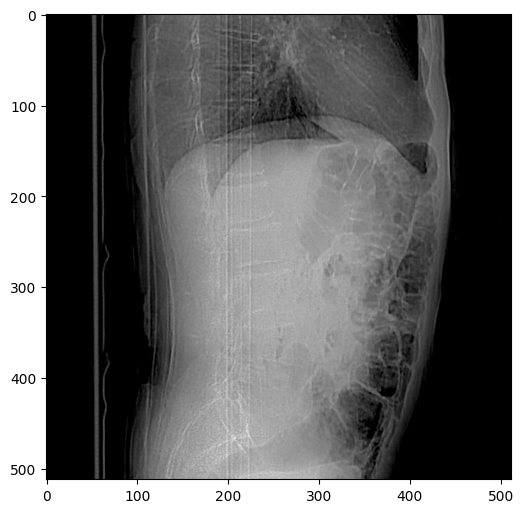

Iteration 5600 PSNR history: [38.880666117102486, 38.83471926685942, 38.84165898812721, 39.054434995832835, 38.85655750671865, 38.716864098857485, 38.59025111644341, 38.845100109476896, 38.787022734244005, 38.47342102582884, 38.59716968924374, 38.650587654683534, 38.82774539334476, 38.54605063786798, 38.64506773352247, 38.516616047718585, 38.818813575432685, 38.801592203286134, 38.97971998183344, 38.78504616127412, 38.913211265751826, 38.97547578702851, 38.75593848981681, 38.80524090138036, 38.748040761323225, 38.986253961851006, 38.825414781874045, 38.49662893955235, 38.38828074949732, 38.747108560303815, 38.69278938960487, 37.80364042288057, 37.82241015965205, 38.31529230515311, 38.9292568060982, 38.81536301996424, 38.368696557735596, 38.41871956277274, 38.93264307706859, 38.746510420045446, 38.33783584615667, 38.38108565881146, 38.89999735512039, 39.003240644006205, 38.808647725340805, 38.93106093351878, 38.92123738035528, 38.590479429955394, 38.67644109939363, 39.030560669940584, 3

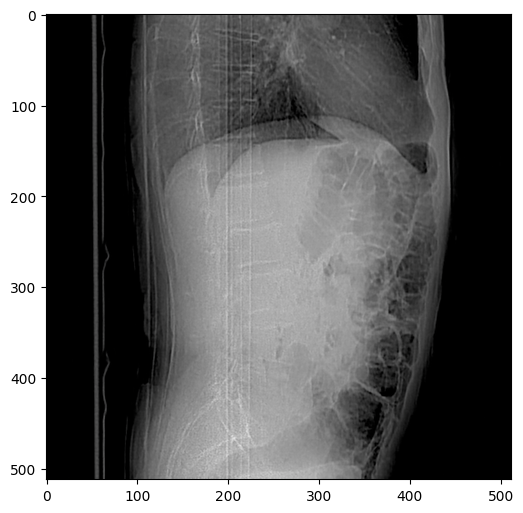

Iteration 5700 PSNR history: [39.12416468371644, 39.04240955142424, 39.11129606408723, 39.14233360360308, 39.10437279592751, 39.04116984267973, 39.04860727928477, 39.17552007549156, 39.11342338216685, 39.15707282474565, 39.105800611181, 39.08282074139613, 38.958979143960214, 39.071792383868925, 39.23741468990126, 39.081667762033305, 39.14490296134773, 39.1428026371227, 39.08572471262897, 39.154086047591846, 39.168113999587845, 39.0304138590393, 38.9664819103423, 38.80751267281293, 38.73979269032394, 39.08577297760232, 39.14206389367799, 38.89384265225465, 38.8280015847871, 39.05076483624227, 39.04051540668208, 38.81310900227898, 38.88921005905818, 39.13851891219293, 39.00816596603059, 38.8988241735496, 38.97929097989025, 39.15548456470106, 39.2009232175588, 39.054122349683965, 39.09026505386721, 39.02225448576687, 39.187165976409176, 39.120106455865795, 39.11421158713263, 39.00154305023314, 39.06600639494172, 39.146791966578846, 39.1633809508844, 39.15005508069732, 39.0953037760758, 39

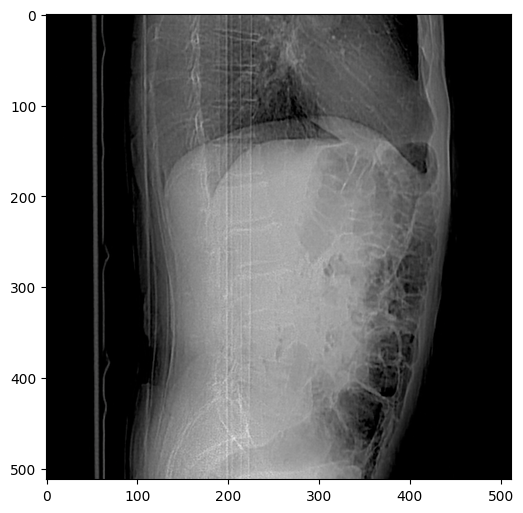

Iteration 5800 PSNR history: [39.096213782937724, 39.16942058344294, 39.19713441744871, 39.151329589107846, 39.17933051588743, 39.21945463648433, 39.20528503052692, 39.21566633678671, 39.18251082963094, 39.00570016398492, 39.03562817166889, 39.260968286056155, 39.23741516831926, 39.256303633015406, 39.15209129096353, 39.170233971849974, 39.08469014229087, 39.13950910650291, 39.00359761158215, 39.25131094143386, 39.251362336929226, 39.27146799967896, 39.208633609223156, 39.28969866089439, 39.34704732634201, 39.21724417641919, 39.20930042963793, 39.165222342828564, 39.224516216788714, 39.361585264933254, 39.293218896577365, 39.21204668034492, 39.23531319968585, 39.25282371525514, 39.3560830595954, 39.25914291462164, 39.30604141979608, 39.21914030327863, 39.308387827073716, 39.367765431343884, 39.28144492469181, 39.0802777165633, 39.071360128393465, 39.18819747056416, 39.249819531823185, 39.2961393144203, 39.164084782030635, 39.19662668041889, 39.26709846904377, 39.38149073759114, 39.2983

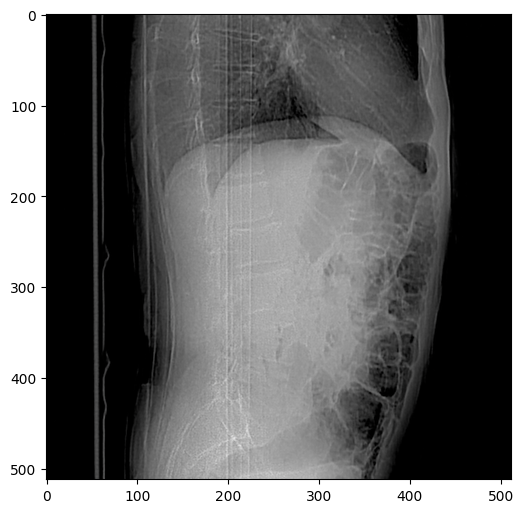

Iteration 5900 PSNR history: [39.317995282936934, 38.77705861942337, 38.82751543279254, 39.00226571381535, 39.2281253700789, 38.9658429191941, 39.09114342177793, 38.96554321318465, 38.91237889493054, 38.70907001148436, 39.12279799973121, 39.18791366449858, 38.74536188755322, 38.82590637416942, 39.07030779198374, 38.739172525680395, 39.061183344915776, 39.140138922696835, 38.87440876592307, 38.87127435663063, 38.85256007609074, 39.04391562669085, 38.97960809626133, 38.98725946283007, 39.11522735409971, 39.021360809486254, 38.73695733882269, 39.04972445752168, 39.080945935466424, 39.22567390708107, 38.85646503793118, 38.810145361032006, 38.94897584056514, 39.230219220890625, 38.99406653719494, 38.91249691316545, 39.00986041266049, 39.221070599646566, 39.22733174655658, 39.0039384917837, 38.9850107895063, 39.056213782605774, 39.1359681793571, 39.07106369361651, 39.10887648517181, 39.141865342186414, 39.289491589379566, 39.1988926305216, 39.24248120228559, 39.346416964890636, 39.3826794940

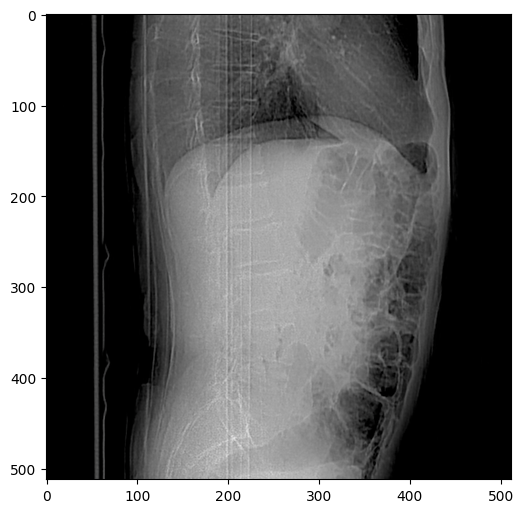

Iteration 6000 PSNR history: [39.33201532531311, 39.35694522164505, 39.46713201208131, 39.314353352243884, 39.393923155681236, 39.36363740842901, 39.49189022235358, 39.45260712064404, 39.49613275830549, 39.36488428910992, 39.495001604929406, 39.27630097777842, 39.27694293461218, 39.31372945121911, 39.37895588437236, 39.403690692338984, 39.3438201101753, 39.28548392888962, 39.50875922602221, 39.41574847166351, 39.354438300079316, 39.43206714058555, 39.38233079787058, 39.50682670342917, 39.47673522492225, 39.476666816521515, 39.462894420135925, 39.49091717017142, 39.4403990896013, 39.33992201145985, 39.23671848180042, 39.29164562673611, 39.336717905426056, 39.44167469970369, 39.45137321136173, 39.51914042376241, 39.26189642963423, 39.34254903718503, 39.442033952975876, 39.553977611203834, 39.47978938740939, 39.464787290302716, 39.47053647548365, 39.4552253985476, 39.49853501812639, 39.5501030267767, 39.39143625473329, 39.05099963894661, 38.950844702847995, 39.01731972209176, 39.280073412

In [ ]:
from skimage.metrics import peak_signal_noise_ratio as compare_psnr
psrn_list = []


import pandas as pd


df_psnr_history = pd.DataFrame(columns=['Iteration', 'Loss', 'PSNR'])

def update_psnr_table(i, loss, psrn):
    df_new_row = {'Iteration': i, 'Loss': loss, 'PSNR': psrn}
    # df_psnr_history = df_psnr_history.append(df_new_row, ignore_index=True)



i = 0
def closure():

    global i

    if param_noise:
        for n in [x for x in net.parameters() if len(x.size()) == 4]:
            n = n + n.detach().clone().normal_() * n.std() / 50

    net_input = net_input_saved
    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)


    out = net(net_input)

    total_loss = mse(out * mask_var, img_var * mask_var)
    total_loss.backward()

    psrn = compare_psnr(img_np, out.detach().cpu().numpy()[0])
    psrn_list.append(psrn)


    print ('Iteration %05d    Loss %f' % (i, total_loss.item()), '\r', end='')


    if  PLOT and i % show_every == 0:
        out_np = torch_to_np(out)
        plot_image_grid([np.clip(out_np, 0, 1)], factor=figsize, nrow=1)
        print(f"Iteration {i} PSNR history: {psrn_list[-show_every:]}")

        total_psnr_sum = sum(psrn_list[-show_every:])
        avg_psnr = total_psnr_sum / show_every if psrn_list else 0
        print(f"Average PSNR over last {show_every} iterations: {avg_psnr:.2f}")

        update_psnr_table(i, total_loss.item(), avg_psnr)


    i += 1



net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()

p = get_params(OPT_OVER, net, net_input)
optimize(OPTIMIZER, p, closure, LR, num_iter)

In [ ]:
psrn_array = np.column_stack((np.arange(len(psrn_list)), psrn_list))

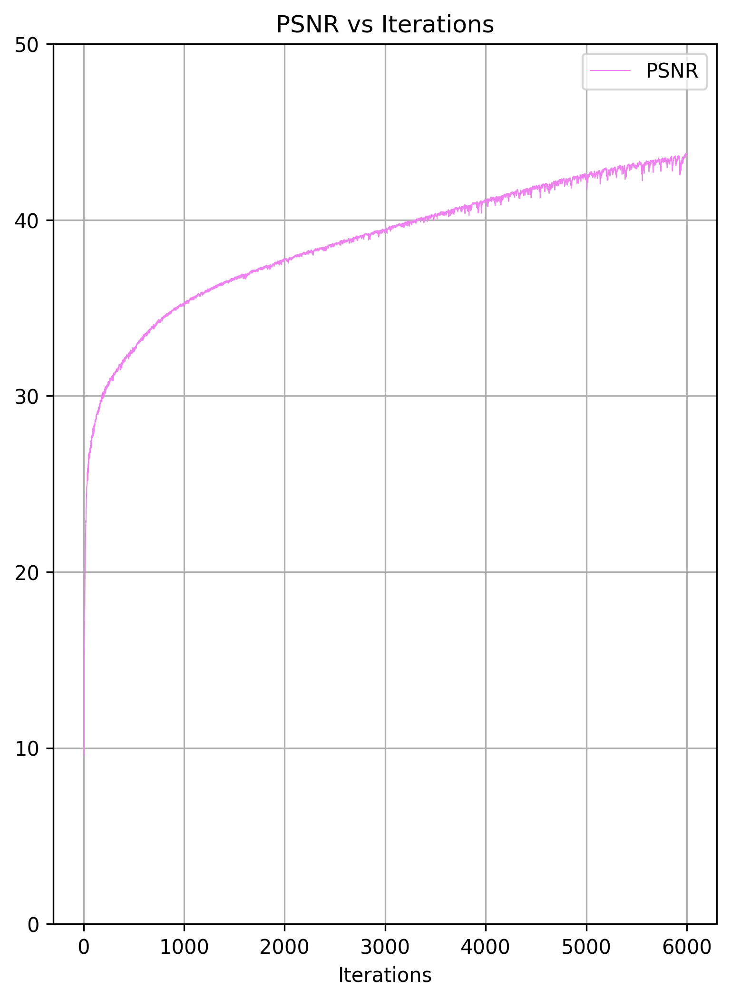

In [ ]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(nrows=1, figsize=(6, 8), dpi=300)

if not isinstance(axs, np.ndarray):
    axs = np.array([axs])

axs[0].plot(psrn_array[:, 0], psrn_array[:, 1], label='PSNR', linewidth=0.5, color='violet' )
axs[0].set_title('PSNR vs Iterations')
axs[0].set_ylim(0.000, 50)  # 设置 y 坐标
axs[0].grid(True)
axs[0].legend()

plt.xlabel('Iterations')
plt.show()

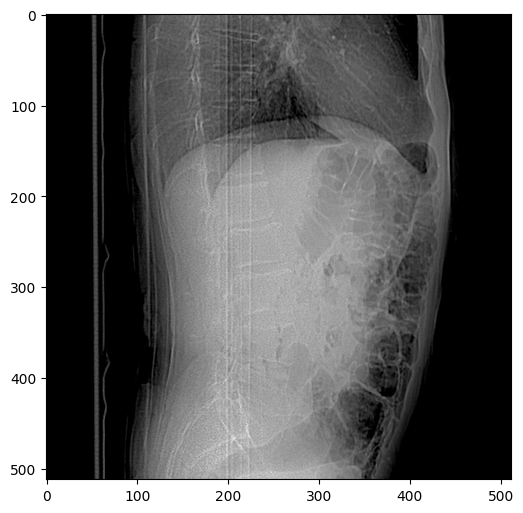

In [ ]:
out_np = torch_to_np(net(net_input))
plot_image_grid([out_np], factor=5);